In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
cd /storage/agrp/barakma/hepattn/

/storage/agrp/barakma/hepattn


In [3]:
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
import yaml
from numpy.lib.recfunctions import structured_to_unstructured as s2u
from tqdm import tqdm

from hepattn.experiments.odd.pflow_data import ODDDataset

In [4]:
cd /storage/agrp/barakma/hepattn/src/hepattn/experiments/clic

/storage/agrp/barakma/hepattn/src/hepattn/experiments/clic


In [5]:
with Path.open("/storage/agrp/barakma/hepattn/src/hepattn/experiments/odd/configs/base_overfit.yaml") as f:
    config = yaml.load(f, Loader=yaml.SafeLoader)

with Path.open(config["data"]["scale_dict_path"]) as f:
    scale_dict = yaml.load(f, Loader=yaml.SafeLoader)

In [6]:
ds = ODDDataset(
    filepath=config["data"]["test_path"],
    inputs={},
    targets={"particle": ["e", "pt", "eta", "sinphi", "cosphi"]},
    scale_dict_path=config["data"]["scale_dict_path"],
    num_events=config["data"].get("num_val", None),
    max_nodes=config["data"]["max_nodes"],
    num_objects=config["data"].get("num_objects", None )

)

Seed set to 42


Loading ODD dataset from /storage/agrp/barakma/PileupODD/data/train with 32 samples
Is inference: False
Total events: 700
Removing 6 events with too many nodes or particles
Limiting to 32 events as requested


Loading Deps: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 4240.95it/s]


Number of events after filtering: 32


In [7]:
# eval_filepath = "../logs/CLIC_Pflow_Full_20250607-T234846/ckpts/epoch=082-val_loss=5.71306__test.h5"
# overfit - /storage/agrp/barakma/hepattn/src/hepattn/experiments/odd/logs/odd_pflow_v1_clic_arch_20260114-T151040/ckpts/epoch=999-val_loss=1.05913__test.h5
eval_filepath = "/storage/agrp/barakma/hepattn/src/hepattn/experiments/odd/logs/odd_pflow_v1_clic_arch_20260114-T151040/ckpts/epoch=999-val_loss=1.05913__test.h5"

In [8]:
from scipy.optimize import linear_sum_assignment


def match_incidence_bool(inputs, targets):
    inputs, targets = torch.from_numpy(inputs).float(), torch.from_numpy(targets).float()
    pos = F.binary_cross_entropy_with_logits(inputs, torch.ones_like(inputs), reduction="none")
    neg = F.binary_cross_entropy_with_logits(inputs, torch.zeros_like(inputs), reduction="none")
    pdist = torch.einsum("bnc,bmc->bnm", pos, targets) + torch.einsum("bnc,bmc->bnm", neg, (1 - targets))
    pdist = pdist.transpose(1, 2).numpy()
    assgn_indices = np.zeros((pdist.shape[0], pdist.shape[1]), dtype=int)
    for i, p in enumerate(pdist):
        _, col_ind = linear_sum_assignment(p)
        assgn_indices[i] = col_ind
    return assgn_indices

In [9]:
def match_incidence(inputs, targets):
    assgn_indices = np.zeros((inputs.shape[0], inputs.shape[1]), dtype=int)
    inputs, targets = torch.from_numpy(inputs).float(), torch.from_numpy(targets).float()
    for i in tqdm(range(inputs.shape[0])):
        loss = -targets[i, None, :] * torch.log(inputs[i, :, None] + 1e-8)
        loss = loss.mean(dim=-1).transpose(0, 1)
        _, col_ind = linear_sum_assignment(loss.numpy())
        assgn_indices[i] = col_ind
    return assgn_indices

In [24]:
f = h5py.File(eval_filepath, "r")

In [26]:
f.keys()

<KeysViewHDF5 ['events', 'incidence', 'object_class', 'object_masks', 'regression']>

In [10]:
def load_file(filepath, return_dict=False):
    with h5py.File(filepath, "r") as f:
        truth_incidence_bool = f["object_masks"]["truth_masks"][:]
        pflow_incidence_bool = f["object_masks"]["mask_logits"][:]

        if "incidence" in f:
            truth_incidence = f["incidence"]["truth_incidence"][:]
            pflow_incidence = f["incidence"]["pred_incidence"][:]
            # assgn_indices = match_incidence(pflow_incidence, truth_incidence)
            assgn_indices = np.zeros((pflow_incidence.shape[0], pflow_incidence.shape[1]), dtype=int)
            for i in tqdm(range(pflow_incidence.shape[0])):
                assgn_indices[i] = np.arange(pflow_incidence.shape[1])
        else:
            truth_incidence = np.zeros_like(truth_incidence_bool)
            pflow_incidence = np.zeros_like(pflow_incidence_bool)
            assgn_indices = match_incidence_bool(pflow_incidence_bool, truth_incidence_bool)
        first_idxs = np.arange(len(truth_incidence_bool))[:, None]

        pflow_incidence = pflow_incidence[first_idxs, assgn_indices, :]

        pflow_incidence_bool = pflow_incidence_bool[first_idxs, assgn_indices, :]

        truth_class = f["object_class"]["object_class"][:]
        pflow_class = f["object_class"]["pflow_class"][:]

        truth_vars = [f"truth_{el}" for el in ["e", "pt", "eta", "sinphi", "cosphi"]]
        pflow_vars = [f"pred_{el}" for el in ["e", "pt", "eta", "sinphi", "cosphi"]]
        proxy_vars = [f"proxy_{el}" for el in ["e", "pt", "eta", "sinphi", "cosphi"]]
        truth_data = s2u(f["regression"].fields(truth_vars)[:])
        pflow_data = s2u(f["regression"].fields(pflow_vars)[:])[first_idxs, assgn_indices, :]
        proxy_data = s2u(f["regression"].fields(proxy_vars)[:])[first_idxs, assgn_indices, :]

        pflow_ptetaphi = np.stack(
            [
                pflow_data[..., 1],
                pflow_data[..., 2],
                np.arctan2(pflow_data[..., 3], pflow_data[..., 4]),
            ],
            axis=-1,
        )
        truth_ptetaphi = np.stack(
            [
                truth_data[..., 1],
                truth_data[..., 2],
                np.arctan2(truth_data[..., 3], truth_data[..., 4]),
            ],
            axis=-1,
        )
        proxy_ptetaphi = np.stack(
            [
                proxy_data[..., 1],
                proxy_data[..., 2],
                np.arctan2(proxy_data[..., 3], proxy_data[..., 4]),
            ],
            axis=-1,
        )

        if "Bin" in filepath:
            pflow_indicator = pflow_class < 1
            truth_indicator = truth_class < 1
        else:
            pflow_indicator = pflow_class < 5
            # pflow_indicator = truth_class < 5
            truth_indicator = truth_class < 5

        neutral_mask = (pflow_class < 5) & (pflow_class > 2)
        pflow_ptetaphi[neutral_mask][..., 0] = pflow_data[neutral_mask][..., 0] / np.cosh(pflow_ptetaphi[neutral_mask][..., 1])
        proxy_ptetaphi[neutral_mask][..., 0] = proxy_data[neutral_mask][..., 0] / np.cosh(proxy_ptetaphi[neutral_mask][..., 1])
        if return_dict:
            return {
                "pflow_incidence": pflow_incidence,
                "truth_incidence": truth_incidence,
                "pflow_class": pflow_class,
                "truth_class": truth_class,
                "pflow_data": pflow_data,
                "truth_data": truth_data,
                "proxy_data": proxy_data,
                "pflow_ptetaphi": pflow_ptetaphi,
                "truth_ptetaphi": truth_ptetaphi,
                "proxy_ptetaphi": proxy_ptetaphi,
                "pflow_indicator": pflow_indicator,
                "truth_indicator": truth_indicator,
            }

        return (
            pflow_incidence,
            truth_incidence,
            pflow_incidence_bool,
            truth_incidence_bool,
            pflow_class,
            truth_class,
            pflow_data,
            truth_data,
            proxy_data,
            pflow_ptetaphi,
            truth_ptetaphi,
            proxy_ptetaphi,
            pflow_indicator,
            truth_indicator,
        )

In [18]:
(
    pflow_incidence,
    truth_incidence,
    pflow_incidence_bool,
    truth_incidence_bool,
    pflow_class,
    truth_class,
    pflow_data,
    truth_data,
    proxy_data,
    pflow_ptetaphi,
    truth_ptetaphi,
    proxy_ptetaphi,
    pflow_indicator,
    truth_indicator,
) = load_file(eval_filepath)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 133549.98it/s]


In [19]:
import torch
from hepattn.utils.masks import topk_attn

def select_charged_tracks(incidence, is_track):
    """
    Selects the best track for each charged particle based on incidence scores,
    ensuring a one-to-one assignment where possible, following the logic from get_proxy_features.

    Args:
        incidence (torch.Tensor): Incidence matrix of shape (batch, n_particles, n_nodes).
        is_track (torch.Tensor): Boolean mask indicating tracks, shape (batch, n_nodes).

    Returns:
        torch.Tensor: Selected charged incidence matrix of shape (batch, n_particles, n_nodes),
                      with 1s for selected track-particle associations and 0s elsewhere.
    """
    # Multiply incidence by is_track to focus on tracks only
    charged_inc = incidence * is_track.unsqueeze(1)  # Shape: (batch, n_particles, n_nodes)

    # Use the most weighted track as proxy for charged particles
    charged_inc_top2 = (topk_attn(charged_inc, 2, dim=-2) & (charged_inc > 0)).float()
    charged_inc_max = charged_inc.max(-2, keepdim=True)[0]
    charged_inc_new = (charged_inc == charged_inc_max) & (charged_inc > 0)

    # ------------------------
    particle_max_idx = charged_inc.argmax(dim=-1, keepdim=True)
    # Create a mask that is True only at that specific index
    is_first_max_particle = torch.zeros_like(charged_inc, dtype=torch.bool).scatter_(-1, particle_max_idx, True)
    # Apply the filter
    charged_inc_new = charged_inc_new & is_first_max_particle
    # ---------------------
    # TODO: check this
    # charged_inc_new = charged_inc.float()
    zero_track_mask = charged_inc_new.sum(-1, keepdim=True) == 0
    charged_inc = torch.where(zero_track_mask, charged_inc_top2, charged_inc_new)

    # -------------------------
    # --- ADDED: Final Cleanup (Fixes the Top2/Recovery duplicates) ---
    # 1. Look at the incidence scores ONLY for the tracks we have currently selected
    current_scores = incidence * charged_inc
    # 2. Find the single best track among the selected ones
    final_best_idx = current_scores.argmax(dim=-1, keepdim=True)
    # 3. Create a strict mask for that one track
    final_strict_mask = torch.zeros_like(charged_inc, dtype=torch.bool).scatter_(-1, final_best_idx, True)
    # 4. Apply the mask. 
    # Note: If charged_inc was all zeros, intersection with final_strict_mask remains zeros.
    charged_inc = charged_inc * final_strict_mask.float()

    return charged_inc


In [13]:
def sigmoid(x, alpha=1):
    x *= alpha
    return 1 / (1 + np.exp(-x))

In [22]:
truth_incidence[idx]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(450, 600), dtype=float32)

In [106]:
truth_incidence[5][(truth_incidence[5] > 0.1) & (truth_incidence[5] < 1)]

array([0.8724668 , 0.43216726, 0.25555512, 0.9481655 , 0.14494391,
       0.47746274, 0.98937213, 0.982881  , 0.54439944, 0.6140055 ,
       0.43276066, 0.7135027 , 0.88210607, 0.44343013, 0.23742555,
       0.12700856, 0.9852663 , 0.71630937, 0.8550561 , 0.9861777 ,
       0.11789395, 0.97605556, 0.5565699 , 0.76257443, 0.96165323,
       0.18403016, 0.15710995, 0.75434005, 0.44825125, 0.44127133,
       0.23094292, 0.2779998 , 0.40754157, 0.98704463, 0.13861744,
       0.4826492 , 0.27799165, 0.7721997 , 0.6139598 , 0.5173508 ,
       0.38275298, 0.24565998, 0.13062377, 0.55174875, 0.9980577 ,
       0.79072565, 0.11851598, 0.88504934, 0.20927434, 0.96523076,
       0.1410883 , 0.33949423, 0.14018853, 0.38966456, 0.9154559 ,
       0.7020965 , 0.53257304, 0.9536132 , 0.9483459 , 0.76929605,
       0.11569355, 0.53145975, 0.26288018, 0.61033547, 0.28051764,
       0.8589117 , 0.88377523, 0.9708217 , 0.37885803, 0.93498844,
       0.2569793 , 0.23070398, 0.53683835, 0.11495065, 0.94427

In [113]:
# Assuming truth_incidence is already loaded as a numpy array of shape (num_events, num_particles, num_nodes)
# and ds is the dataset object

import numpy as np

# List to collect the locations and values where the condition holds
inc_locations = []

# Loop over all events
for idx in range(len(ds)):
    # Get the incidence matrix for this event
    inc = truth_incidence[idx]
    
    # Find indices where the condition is True
    condition = (inc > 0.1) & (inc < 1)
    particle_indices, node_indices = np.where(condition)
    
    # Collect for each location
    for p_idx, n_idx in zip(particle_indices, node_indices):
        inc_value = inc[p_idx, n_idx]
        inc_locations.append((idx, p_idx, n_idx, inc_value))

# Convert to numpy array for easier handling if needed
inc_locations = np.array(inc_locations)

# Print summary
print(f"Total locations found: {len(inc_locations)}")
if len(inc_locations) > 0:
    print("Sample locations (idx, particle_idx, node_idx, inc_value):")
    for loc in inc_locations[:10]:  # Print first 10 for inspection
        print(f"Event {loc[0]}, Particle {loc[1]}, Node {loc[2]}, Value {loc[3]:.4f}")
else:
    print("No locations satisfy the condition across all events.")

Total locations found: 7356
Sample locations (idx, particle_idx, node_idx, inc_value):
Event 0.0, Particle 1.0, Node 19.0, Value 0.9967
Event 0.0, Particle 1.0, Node 20.0, Value 0.2564
Event 0.0, Particle 1.0, Node 22.0, Value 0.9898
Event 0.0, Particle 1.0, Node 23.0, Value 0.9786
Event 0.0, Particle 1.0, Node 95.0, Value 0.7441
Event 0.0, Particle 1.0, Node 119.0, Value 0.3224
Event 0.0, Particle 1.0, Node 151.0, Value 0.7569
Event 0.0, Particle 2.0, Node 20.0, Value 0.7436
Event 0.0, Particle 2.0, Node 34.0, Value 0.9061
Event 0.0, Particle 2.0, Node 95.0, Value 0.2559


In [115]:
truth_incidence[0][1][20]

np.float32(0.25643116)

Number of tracks: 40


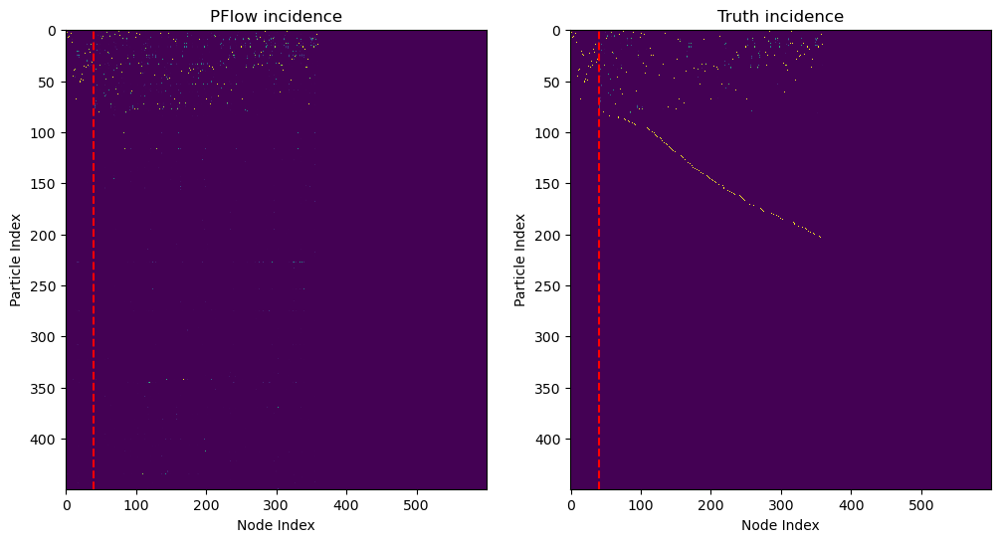

In [117]:
idx = 9
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
node_mask = ds[idx][1]["node_valid"]
n_tracks = ds.n_tracks[idx]
ax[0].imshow(
    (pflow_incidence[idx] * node_mask.unsqueeze(0).numpy()),
    interpolation="nearest",
    aspect="auto",
)
ax[0].axvline(n_tracks, color="red", linestyle="--")
ax[0].set_title("PFlow incidence")
ax[0].set_xlabel("Node Index")
ax[0].set_ylabel("Particle Index")
ax[1].imshow(
    truth_incidence[idx],
    interpolation="nearest",
    aspect="auto",
)
ax[1].axvline(n_tracks, color="red", linestyle="--")
ax[1].set_title("Truth incidence")
ax[1].set_xlabel("Node Index")
ax[1].set_ylabel("Particle Index")
print("Number of tracks:", n_tracks)
plt.show()

Number of tracks: 40


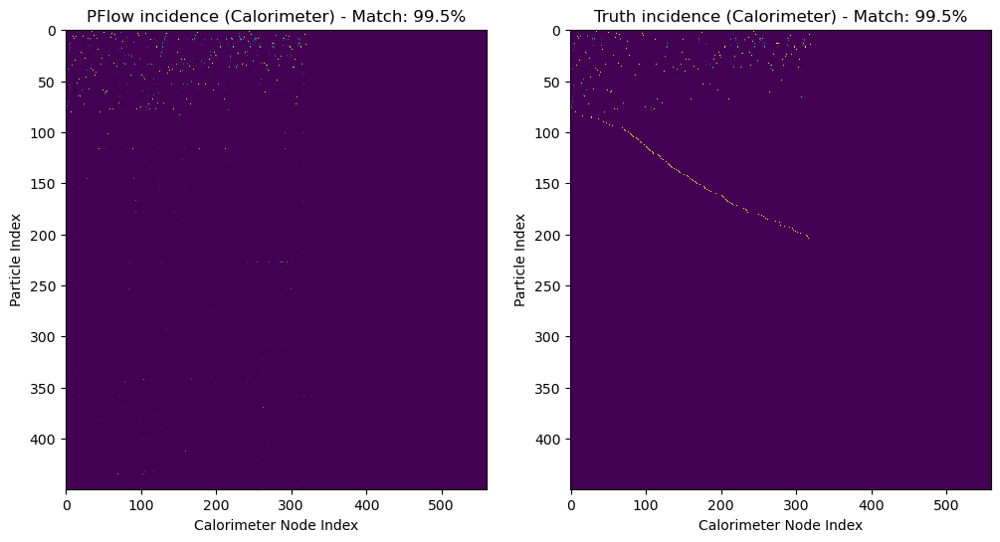

In [124]:
idx = 9
node_mask = ds[idx][1]["node_valid"]
n_tracks = ds.n_tracks[idx]

# Slice to calorimeter cells only (columns from n_tracks onwards)
pflow_cal = pflow_incidence[idx][:, n_tracks:] * node_mask[n_tracks:].unsqueeze(0).numpy()
truth_cal = truth_incidence[idx][:, n_tracks:]

# Calculate match percentage: both >0.1 or both <=0.1
match_mask = np.abs((pflow_cal - truth_cal)) < 0.01
match_percentage = np.mean(match_mask) * 100

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(
    pflow_cal,
    interpolation="nearest",
    aspect="auto",
)
ax[0].set_title(f"PFlow incidence (Calorimeter) - Match: {match_percentage:.1f}%")
ax[0].set_xlabel("Calorimeter Node Index")
ax[0].set_ylabel("Particle Index")
ax[1].imshow(
    truth_cal,
    interpolation="nearest",
    aspect="auto",
)
ax[1].set_title(f"Truth incidence (Calorimeter) - Match: {match_percentage:.1f}%")
ax[1].set_xlabel("Calorimeter Node Index")
ax[1].set_ylabel("Particle Index")
print("Number of tracks:", n_tracks)
plt.show()

Processing 30 events to gather statistics...
Processing complete.


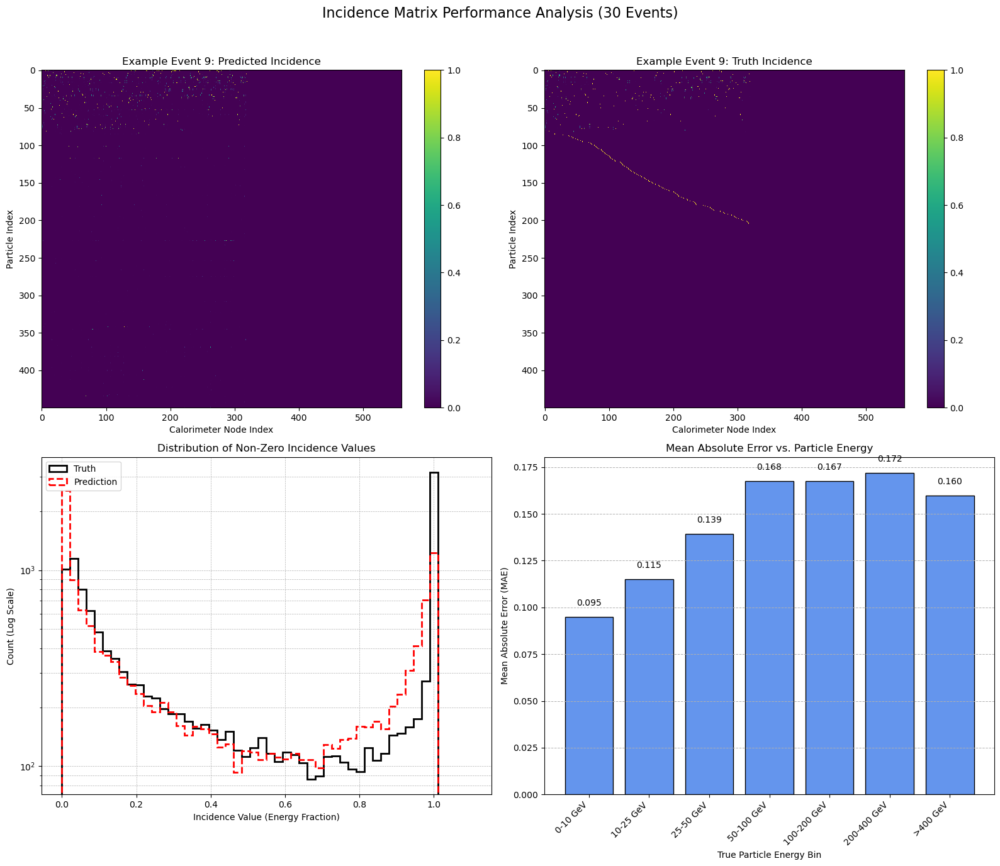


Overall MAE on active calorimeter cells: 0.1201
Number of active truth calorimeter cells processed: 13729
Average predicted value on active cells: 0.4092
Average truth value on active cells: 0.4720


In [129]:
import numpy as np
import matplotlib.pyplot as plt

# --- Configuration ---
# Select one event to visualize with imshow
example_idx = 9 
# Process N events to get statistics for histograms and binned plots
num_events_to_process = 30 

# Define energy bins for the accuracy plot (in GeV)
energy_bins = np.array([0, 10, 25, 50, 100, 200, 400])

# --- Data Collection Loop ---
all_errors = []
all_energies = []
all_pflow_values = []
all_truth_values = []

print(f"Processing {num_events_to_process} events to gather statistics...")

for i in range(num_events_to_process):
    # --- Get data for the current event ---
    # ds[i][0] are inputs, ds[i][1] are labels
    labels = ds[i][1]
    
    node_mask = labels["node_valid"]
    n_tracks = ds.n_tracks[i]
    n_particles = ds.n_particles[i]

    # Get the calorimeter part of the incidence matrices
    pflow_cal = pflow_incidence[i][:, n_tracks:]
    truth_cal = truth_incidence[i][:, n_tracks:]
    
    particle_energies_scaled = labels["particle_e"][:n_particles]
    
    # --- FIX IS HERE ---
    # Pass the tensor (particle_energies_scaled) to inverse_transform, THEN convert to numpy
    particle_energies_true = ds.scaler.transforms['e'].inverse_transform(particle_energies_scaled).cpu().numpy()

    # --- Find "active" cells to calculate meaningful metrics ---
    # An active cell is where the truth incidence is non-zero
    active_mask = truth_cal[:n_particles, :] > 0.01
    
    if active_mask.sum() == 0:
        continue # Skip events with no calorimeter deposits

    # Get the predicted and true values ONLY for these active cells
    pflow_active_values = pflow_cal[:n_particles, :][active_mask]
    truth_active_values = truth_cal[:n_particles, :][active_mask]
    
    # Find the corresponding particle energy for each active cell
    particle_indices_for_active_cells = np.where(active_mask)[0]
    energies_for_active_cells = particle_energies_true[particle_indices_for_active_cells]

    # Calculate the error for each active cell
    absolute_errors = np.abs(pflow_active_values - truth_active_values)

    # Store results
    all_errors.extend(absolute_errors)
    all_energies.extend(energies_for_active_cells)
    all_pflow_values.extend(pflow_active_values)
    all_truth_values.extend(truth_active_values)

print("Processing complete.")

# --- Convert lists to numpy arrays for analysis ---
all_errors = np.array(all_errors)
all_energies = np.array(all_energies)

# --- Calculate Binned Metrics ---
# Assign each error to an energy bin
bin_indices = np.digitize(all_energies, energy_bins)

# Calculate the Mean Absolute Error for each bin
mae_per_bin = [np.mean(all_errors[bin_indices == i]) for i in range(1, len(energy_bins) + 1)]

# --- Plotting ---
fig, ax = plt.subplots(2, 2, figsize=(16, 14))
fig.suptitle(f"Incidence Matrix Performance Analysis ({num_events_to_process} Events)", fontsize=16)

# 1. PFlow Incidence for the example event
n_tracks_ex = ds.n_tracks[example_idx]
im = ax[0, 0].imshow(pflow_incidence[example_idx][:, n_tracks_ex:], interpolation="nearest", aspect="auto", vmin=0, vmax=1)
ax[0, 0].set_title(f"Example Event {example_idx}: Predicted Incidence")
ax[0, 0].set_xlabel("Calorimeter Node Index")
ax[0, 0].set_ylabel("Particle Index")
fig.colorbar(im, ax=ax[0, 0])

# 2. Truth Incidence for the example event
im = ax[0, 1].imshow(truth_incidence[example_idx][:, n_tracks_ex:], interpolation="nearest", aspect="auto", vmin=0, vmax=1)
ax[0, 1].set_title(f"Example Event {example_idx}: Truth Incidence")
ax[0, 1].set_xlabel("Calorimeter Node Index")
ax[0, 1].set_ylabel("Particle Index")
fig.colorbar(im, ax=ax[0, 1])

# 3. Histogram of Active Cell Values
ax[1, 0].hist(all_truth_values, bins=50, range=(0,1.1), histtype='step', lw=2, label='Truth', color='black')
ax[1, 0].hist(all_pflow_values, bins=50, range=(0,1.1), histtype='step', lw=2, label='Prediction', color='red', linestyle='--')
ax[1, 0].set_title("Distribution of Non-Zero Incidence Values")
ax[1, 0].set_xlabel("Incidence Value (Energy Fraction)")
ax[1, 0].set_ylabel("Count (Log Scale)")
ax[1, 0].set_yscale('log')
ax[1, 0].legend()
ax[1, 0].grid(True, which='both', linestyle='--', linewidth=0.5)

# 4. MAE binned by Truth Energy
bin_labels = [f'{energy_bins[i]}-{energy_bins[i+1]} GeV' for i in range(len(energy_bins)-1)]
bin_labels.append(f'>{energy_bins[-1]} GeV')
bar_positions = np.arange(len(mae_per_bin))

ax[1, 1].bar(bar_positions, mae_per_bin, color='cornflowerblue', edgecolor='black')
ax[1, 1].set_xticks(bar_positions)
ax[1, 1].set_xticklabels(bin_labels, rotation=45, ha='right')
ax[1, 1].set_title("Mean Absolute Error vs. Particle Energy")
ax[1, 1].set_ylabel("Mean Absolute Error (MAE)")
ax[1, 1].set_xlabel("True Particle Energy Bin")
ax[1, 1].grid(axis='y', linestyle='--', linewidth=0.7)

# Add MAE values on top of the bars
for i, v in enumerate(mae_per_bin):
    if not np.isnan(v):
        ax[1, 1].text(i, v + 0.005, f"{v:.3f}", ha='center', va='bottom')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# --- Print Overall Statistics ---
overall_mae = np.mean(all_errors)
print(f"\nOverall MAE on active calorimeter cells: {overall_mae:.4f}")
print(f"Number of active truth calorimeter cells processed: {len(all_truth_values)}")
print(f"Average predicted value on active cells: {np.mean(all_pflow_values):.4f}")
print(f"Average truth value on active cells: {np.mean(all_truth_values):.4f}")

In [133]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# --- Configuration ---
idx = 9  # The event index
n_tracks = ds.n_tracks[idx]
n_particles = ds.n_particles[idx]

# 1. Get the Incidence Matrices
pred_matrix = pflow_incidence[idx][:, n_tracks:]
truth_matrix = truth_incidence[idx][:, n_tracks:]

# Trim to valid particles
pred_matrix = pred_matrix[:n_particles, :]
truth_matrix = truth_matrix[:n_particles, :]

# Calculate Difference Matrix for the tooltip
diff_matrix = pred_matrix - truth_matrix

# 2. Get Raw Node Energies and Indices
raw_node_energies = ds[idx][0]['node_e'][n_tracks:]

# Tile arrays to match matrix shape (n_particles, n_cols)
node_energies_2d = np.tile(raw_node_energies, (n_particles, 1))
node_indices = np.arange(n_tracks, n_tracks + pred_matrix.shape[1])
node_indices_2d = np.tile(node_indices, (n_particles, 1))

# --- 3. Prepare "Cross-Reference" Data ---
# We stack 4 layers of data into customdata so every pixel knows everything about itself
# Layer 0: Node Energy
# Layer 1: Global Node Index
# Layer 2: The "Other" Matrix Value (Truth if we are on Pred, Pred if we are on Truth)
# Layer 3: The Difference

# For Left Plot (Prediction): Layer 2 is Truth
pred_custom_data = np.dstack((node_energies_2d, node_indices_2d, truth_matrix, diff_matrix))

# For Right Plot (Truth): Layer 2 is Prediction
truth_custom_data = np.dstack((node_energies_2d, node_indices_2d, pred_matrix, diff_matrix))

# --- Create Plot ---
fig = make_subplots(
    rows=1, cols=2, 
    subplot_titles=(f"Prediction (Event {idx})", f"Truth (Event {idx})"),
    shared_yaxes=True,
    horizontal_spacing=0.02
)

# --- Hover Templates ---
# %{z} refers to the value of the current heatmap
# %{customdata[2]} refers to the value of the OTHER heatmap

pred_template = (
    "<b>Particle Idx:</b> %{y}<br>" +
    "<b>Node Idx:</b> %{customdata[1]}<br>" +
    "<b>Node Energy:</b> %{customdata[0]:.2f} GeV<br>" +
    "---------------------<br>" +
    "<b>Prediction:</b> %{z:.4f} (This Cell)<br>" +
    "<b>Truth:</b>      %{customdata[2]:.4f} (Other Graph)<br>" +
    "<b>Diff:</b>       %{customdata[3]:.4f}<extra></extra>"
)

truth_template = (
    "<b>Particle Idx:</b> %{y}<br>" +
    "<b>Node Idx:</b> %{customdata[1]}<br>" +
    "<b>Node Energy:</b> %{customdata[0]:.2f} GeV<br>" +
    "---------------------<br>" +
    "<b>Prediction:</b> %{customdata[2]:.4f} (Other Graph)<br>" +
    "<b>Truth:</b>      %{z:.4f} (This Cell)<br>" +
    "<b>Diff:</b>       %{customdata[3]:.4f}<extra></extra>"
)

# -- Left Plot: Prediction --
fig.add_trace(
    go.Heatmap(
        z=pred_matrix,
        customdata=pred_custom_data,
        colorscale='Viridis',
        zmin=0, zmax=1,
        hovertemplate=pred_template,
        name="Prediction",
        colorbar=dict(x=0.46, len=0.8, thickness=15)
    ),
    row=1, col=1
)

# -- Right Plot: Truth --
fig.add_trace(
    go.Heatmap(
        z=truth_matrix,
        customdata=truth_custom_data,
        colorscale='Viridis',
        zmin=0, zmax=1,
        hovertemplate=truth_template,
        name="Truth",
        showscale=False
    ),
    row=1, col=2
)

# --- Layout: Sync Zoom + Crosshairs (Spikes) ---
fig.update_layout(
    height=700,
    width=1200,
    title_text="Comparison: Hover over one to see both values",
    dragmode='zoom',
    hovermode='closest' # Ensures specific cell selection
)

# Common Axis Properties
axis_config = dict(
    matches='x',           # Sync Zoom
    showspikes=True,       # Show Crosshairs
    spikemode='across',    # Draw line all the way across the subplot
    spikesnap='cursor',    # Snap to cursor
    showline=True,
    spikecolor="white",    # Visible on dark background
    spikethickness=1,
    spikedash='solid'
)

y_axis_config = dict(
    matches='y',           # Sync Zoom Vertical
    autorange='reversed',  # Standard Matrix View
    showspikes=True,
    spikemode='across',
    spikecolor="white",
    spikethickness=1,
    spikedash='solid'
)

# Apply configs
fig.update_xaxes(**axis_config, title_text="Calorimeter Node Index", row=1, col=1)
fig.update_xaxes(**axis_config, title_text="Calorimeter Node Index", row=1, col=2)

fig.update_yaxes(**y_axis_config, title_text="Particle Index", row=1, col=1)
fig.update_yaxes(**y_axis_config, row=1, col=2)

fig.show()

array([[2.03801909e-09, 1.84749733e-11, 3.38755608e-12, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.46646697e-13, 6.53247744e-16, 4.50847821e-14, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.32319803e-06, 1.20081631e-05, 4.57025976e-07, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [8.99946897e-17, 1.53212696e-16, 3.41834200e-11, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.29756462e-13, 1.41680721e-12, 1.14674165e-07, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.42808048e-07, 1.94109731e-07, 8.54096260e-09, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],
      shape=(450, 560), dtype=float32)

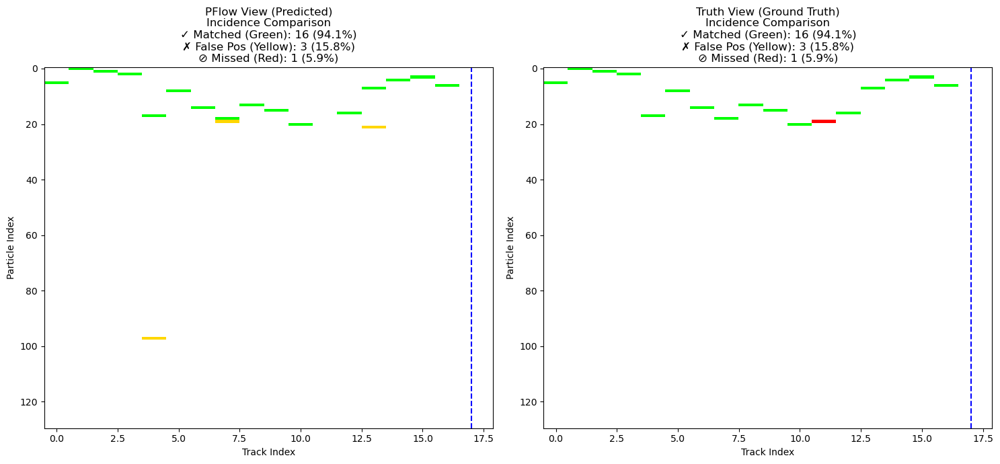

MATCHING DETAILED STATISTICS
Tracks analyzed (cols) : 17
------------------------------
MATCHED (Green)      : 16    (Intersection)
FALSE POS (Yellow)   : 3     (Prediction Only)
MISSED (Red)         : 1     (Truth Only)
------------------------------
Total Prediction Hits: 19
Total Truth Hits     : 17
Recall (Efficiency)  : 94.12%


In [31]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import numpy as np
import torch

# --- 1. Data Preparation ---
idx = 0
slice_index = 130
# Get event data
# node_mask = ds[idx][0]["node_valid"] # Unused variable
n_tracks = ds.n_tracks[idx]
is_track = ds[idx][0]["node_is_track"]

# Convert to torch tensors
pflow_incidence_torch = torch.from_numpy(pflow_incidence[idx:idx+1]).float()
is_track_torch = is_track.unsqueeze(0)

# Use the select_charged_tracks function
pred_binary_torch = select_charged_tracks(pflow_incidence_torch, is_track_torch)
pred_binary = pred_binary_torch.squeeze(0).numpy()

# Define slices (Top slice_index particles, track columns only)
truth_slice = truth_incidence_bool[idx][:slice_index, :n_tracks]
pflow_slice = pred_binary[:slice_index, :n_tracks]

# --- 2. Logic & Masking ---
# TP: Both represent a hit (Intersection)
matches = (truth_slice == 1) & (pflow_slice == 1)
# FP: Predicted hit, but no truth hit (Prediction - Truth)
pflow_only = (pflow_slice == 1) & (truth_slice == 0)
# FN: Truth hit, but no predicted hit (Truth - Prediction)
truth_only = (truth_slice == 1) & (pflow_slice == 0)

# --- 3. Statistics Calculation ---
n_matches = np.count_nonzero(matches)
n_pflow_only = np.count_nonzero(pflow_only)
n_truth_only = np.count_nonzero(truth_only)
n_total_truth = np.sum(truth_slice)
n_total_pflow = np.sum(pflow_slice)

# Helper for safe percentage calculation
def safe_pct(num, denom):
    return (num / denom * 100) if denom > 0 else 0

match_eff = safe_pct(n_matches, n_total_truth)
fp_rate   = safe_pct(n_pflow_only, n_total_pflow)
fn_rate   = safe_pct(n_truth_only, n_total_truth)

title_str = (
    f"Incidence Comparison\n"
    f"✓ Matched (Green): {n_matches} ({match_eff:.1f}%)\n"
    f"✗ False Pos (Yellow): {n_pflow_only} ({fp_rate:.1f}%)\n"
    f"⊘ Missed (Red): {n_truth_only} ({fn_rate:.1f}%)"
)

# --- 4. Visualization Matrix Prep ---
# Custom colormap: 0=White (Bg), 1=Lime (Match), 2=Gold (PFlow Only), 3=Red (Truth Only)
cmap = ListedColormap(['white', 'lime', 'gold', 'red'])

# Initialize display matrices with background (0)
display_pflow = np.zeros_like(pflow_slice, dtype=int)
display_truth = np.zeros_like(truth_slice, dtype=int)

# Fill PFlow View: Match (1), False Pos (2)
display_pflow[matches] = 1 
display_pflow[pflow_only] = 2

# Fill Truth View: Match (1), Missed (3)
display_truth[matches] = 1
display_truth[truth_only] = 3

# --- 5. Plotting ---
fig, ax = plt.subplots(1, 2, figsize=(15, 7))

# Helper function to prevent code duplication between Left/Right plots
def plot_incidence(axis, data, title_prefix):
    axis.imshow(data, interpolation="nearest", aspect="auto", cmap=cmap, vmin=0, vmax=3)
    axis.axvline(n_tracks, color="blue", linestyle="--")
    axis.set_title(f"{title_prefix}\n{title_str}")
    axis.set_xlabel("Track Index")
    axis.set_ylabel("Particle Index")

# Plot Left (Prediction) and Right (Truth)
plot_incidence(ax[0], display_pflow, "PFlow View (Predicted)")
plot_incidence(ax[1], display_truth, "Truth View (Ground Truth)")

plt.tight_layout()
plt.show()

# --- 6. Text Report ---
print("="*60)
print("MATCHING DETAILED STATISTICS")
print("="*60)
print(f"Tracks analyzed (cols) : {n_tracks}")
print("-" * 30)
print(f"MATCHED (Green)      : {n_matches:<5} (Intersection)")
print(f"FALSE POS (Yellow)   : {n_pflow_only:<5} (Prediction Only)")
print(f"MISSED (Red)         : {n_truth_only:<5} (Truth Only)")
print("-" * 30)
print(f"Total Prediction Hits: {int(n_total_pflow)}")
print(f"Total Truth Hits     : {int(n_total_truth)}")
print(f"Recall (Efficiency)  : {match_eff:.2f}%")

Analyzing 32 events...


  0%|                                                                                                                       | 0/32 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 159.65it/s]


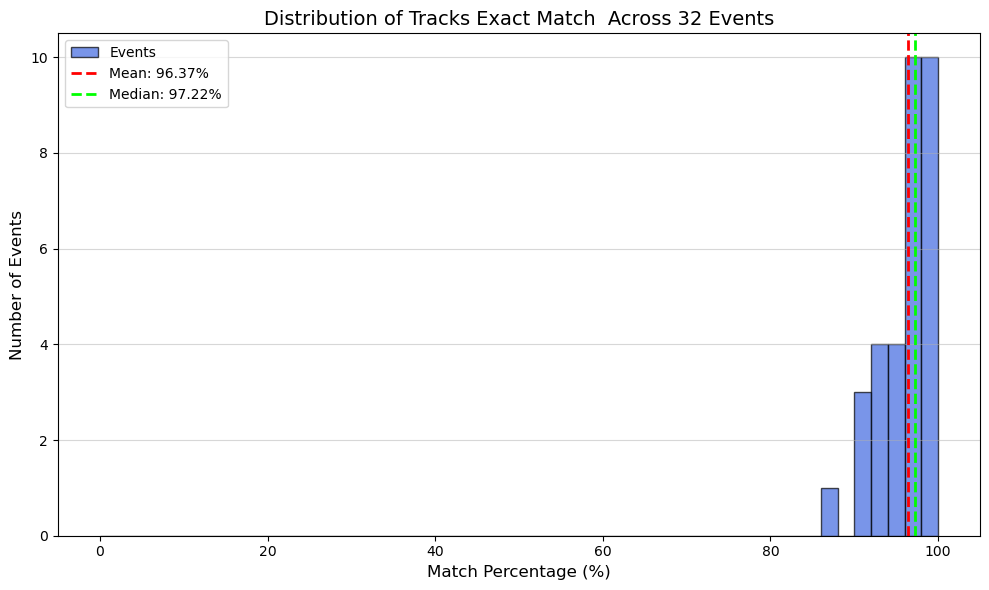

AGGREGATE STATISTICS
Total Events Processed : 32
Events with Truth Hits : 32
----------------------------------------
Mean Match %           : 96.37%
Median Match %         : 97.22%
Std Dev                : 3.45%
Min / Max              : 86.05% / 100.00%


In [32]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm import tqdm  # Progress bar

# List to store efficiency for every event
match_efficiencies = []

# Determine number of events
num_events = len(ds)

print(f"Analyzing {num_events} events...")

# Loop through all events
for i in tqdm(range(num_events)):
    
    # 1. Get Event Data
    n_tracks = ds.n_tracks[i]
    is_track = ds[i][0]["node_is_track"]

    # 2. Prepare Tensors
    # Note: select_charged_tracks likely expects a batch dim, hence [i:i+1]
    pflow_incidence_torch = torch.from_numpy(pflow_incidence[i:i+1]).float()
    is_track_torch = is_track.unsqueeze(0)

    # 3. Run Prediction Logic
    with torch.no_grad(): # Disable gradients for faster inference
        pred_binary_torch = select_charged_tracks(pflow_incidence_torch, is_track_torch)
    
    pred_binary = pred_binary_torch.squeeze(0).numpy()

    # 4. Slice Data (Top 50 particles, valid tracks only)
    # We stick to the [:50] limit to match your previous specific logic
    truth_slice = truth_incidence_bool[i][:50, :n_tracks]
    pflow_slice = pred_binary[:50, :n_tracks]

    # 5. Calculate Statistics
    # Intersection (True Positives)
    matches = (truth_slice == 1) & (pflow_slice == 1)
    
    n_matches = np.count_nonzero(matches)
    n_total_truth = np.sum(truth_slice)

    # Calculate percentage (Handle division by zero if an event has no valid truth particles)
    if n_total_truth > 0:
        eff = (n_matches / n_total_truth) * 100
        match_efficiencies.append(eff)
    else:
        # Optional: Decide if you want to count empty events as 100%, 0%, or skip.
        # Here we skip them to avoid skewing the distribution of "active" events.
        pass

# --- Plotting ---
plt.figure(figsize=(10, 6))

# Histogram
counts, bins, patches = plt.hist(
    match_efficiencies, 
    bins=50, 
    range=(0, 100), 
    color='royalblue', 
    edgecolor='black', 
    alpha=0.7,
    label='Events'
)

# Calculate aggregate stats
mean_eff = np.mean(match_efficiencies)
median_eff = np.median(match_efficiencies)
std_eff = np.std(match_efficiencies)

# Add vertical lines for Mean and Median
plt.axvline(mean_eff, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_eff:.2f}%')
plt.axvline(median_eff, color='lime', linestyle='dashed', linewidth=2, label=f'Median: {median_eff:.2f}%')

# Styling
plt.title(f"Distribution of Tracks Exact Match  Across {len(match_efficiencies)} Events", fontsize=14)
plt.xlabel("Match Percentage (%)", fontsize=12)
plt.ylabel("Number of Events", fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.5)

plt.tight_layout()
plt.show()

# Print Summary
print("="*40)
print("AGGREGATE STATISTICS")
print("="*40)
print(f"Total Events Processed : {num_events}")
print(f"Events with Truth Hits : {len(match_efficiencies)}")
print("-" * 40)
print(f"Mean Match %           : {mean_eff:.2f}%")
print(f"Median Match %         : {median_eff:.2f}%")
print(f"Std Dev                : {std_eff:.2f}%")
print(f"Min / Max              : {np.min(match_efficiencies):.2f}% / {np.max(match_efficiencies):.2f}%")

In [33]:
truth_incidence_bool[idx][:, :n_tracks]

array([[0, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 1, 0, 1],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(450, 39))

/tmp/ipykernel_143286/3217146905.py:3: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))


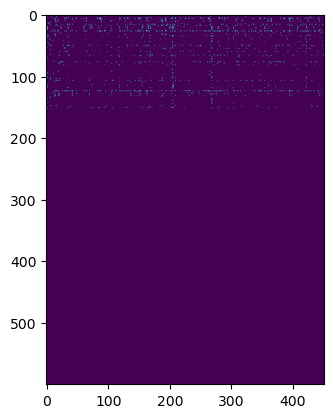

In [34]:
plt.imshow(sigmoid(pflow_incidence_bool[idx]).T)

Number of tracks: 17


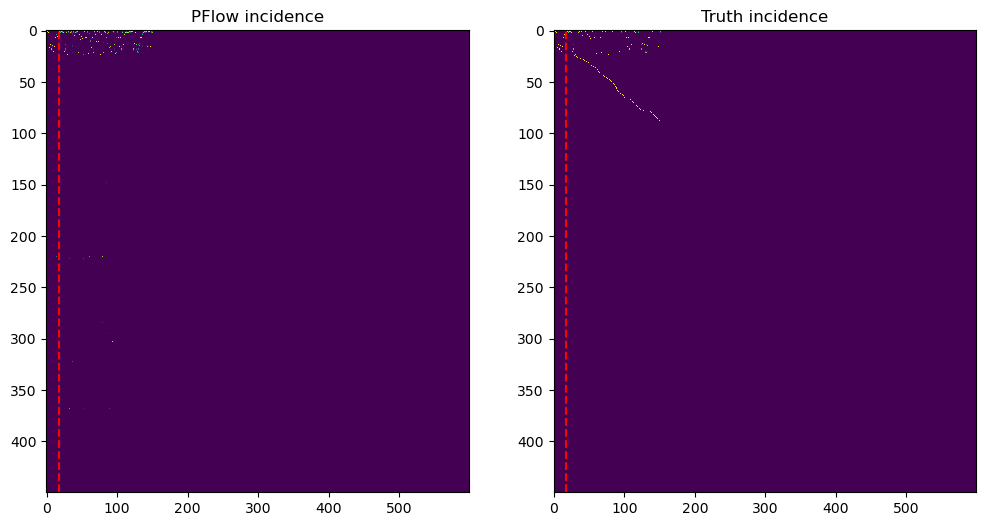

In [35]:
idx = 0
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
node_mask = ds[idx][1]["node_valid"]
n_tracks = ds.n_tracks[idx]
ax[0].imshow(
    (pflow_incidence[idx] * node_mask.unsqueeze(0).numpy()),
    interpolation="nearest",
    aspect="auto",
)
ax[0].axvline(n_tracks, color="red", linestyle="--")
ax[0].set_title("PFlow incidence")
ax[1].imshow(
    truth_incidence[idx],
    interpolation="nearest",
    aspect="auto",
)
ax[1].axvline(n_tracks, color="red", linestyle="--")
ax[1].set_title("Truth incidence")
print("Number of tracks:", n_tracks)
plt.show()

In [36]:
pflow_class[0]

array([0, 0, 0, 0, 0, 0, 0, 2, 0, 3, 3, 3, 3, 0, 2, 0, 0, 1, 0, 0, 0, 3,
       3, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       0, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,

In [34]:
!pip install comet_ml

Defaulting to user installation because normal site-packages is not writeable


In [35]:
proxy_data[0, :10, 2]

array([ 1.4897509 ,  2.6679242 ,  2.168685  , -0.3804388 , -0.19689023,
       -0.6192957 , -0.81845504,  1.169354  , -0.36045623, -1.1104858 ],
      dtype=float32)

In [36]:
proxy_ptetaphi[0, :10, 1]

array([ 1.4897509 ,  2.6679242 ,  2.168685  , -0.3804388 , -0.19689023,
       -0.6192957 , -0.81845504,  1.169354  , -0.36045623, -1.1104858 ],
      dtype=float32)

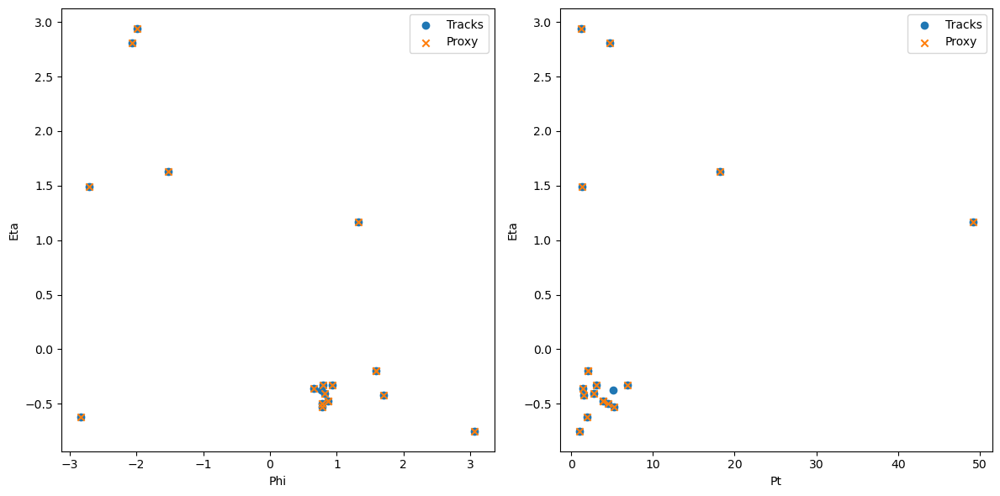

In [37]:
idx = 0
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
inputs = ds[idx][0]

ax[0].scatter(
    inputs["node_phi"][inputs["node_is_track"] > 0],
    inputs["node_eta"][inputs["node_is_track"] > 0],
    marker="o",
    label="Tracks",
)
ax[0].scatter(
    proxy_ptetaphi[idx, :, 2][pflow_class[idx] < 3],
    proxy_ptetaphi[idx, :, 1][pflow_class[idx] < 3],
    marker="x",
    label="Proxy",
)
ax[1].scatter(
    inputs["node_pt"][inputs["node_is_track"] > 0],
    inputs["node_eta"][inputs["node_is_track"] > 0],
    marker="o",
    label="Tracks",
)
ax[1].scatter(
    proxy_ptetaphi[idx, :, 0][pflow_class[idx] < 3],
    proxy_ptetaphi[idx, :, 1][pflow_class[idx] < 3],
    marker="x",
    label="Proxy",
)
ax[0].set_xlabel("Phi")
ax[0].set_ylabel("Eta")
ax[1].set_xlabel("Pt")
ax[1].set_ylabel("Eta")
ax[0].legend()
ax[1].legend()
fig.tight_layout()
plt.show()

/usr/wipp/conda/24.5.0u/envs/common/lib/python3.11/site-packages/numpy/lib/_histograms_impl.py:897: RuntimeWarning: invalid value encountered in divide
  return n / db / n.sum(), bin_edges


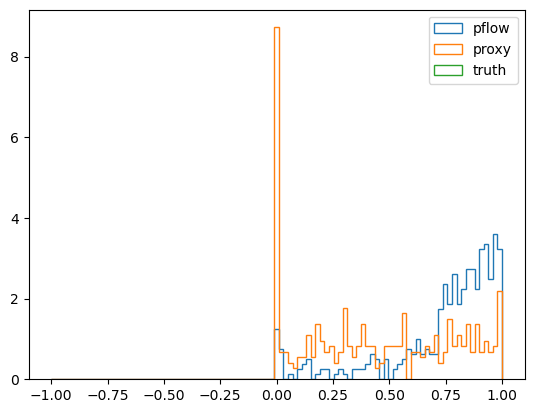

In [38]:
plt.hist(pflow_data[..., 1][pflow_indicator], bins=np.linspace(-1, 1, 100), histtype="step", label="pflow", density=True)
plt.hist(proxy_data[..., 1][pflow_indicator], bins=np.linspace(-1, 1, 100), histtype="step", label="proxy", density=True)
plt.hist(truth_data[..., 1][truth_indicator], bins=np.linspace(-1, 1, 100), histtype="step", label="truth", density=True)
plt.legend()

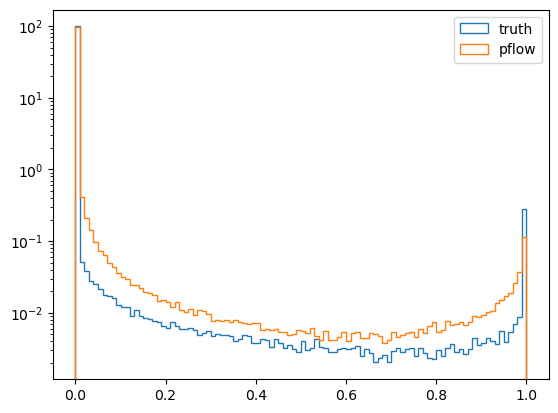

In [39]:
plt.hist(truth_incidence[truth_indicator].flatten(), bins=100, histtype="step", label="truth", density=True)
plt.hist(pflow_incidence[pflow_indicator].flatten(), bins=100, histtype="step", label="pflow", density=True)
plt.yscale("log")
plt.legend()

In [40]:
n_truth = ds.n_particles[0]
particle_data = torch.stack(
    [
        ds.full_data_array["particle_energy"][:n_truth],
        ds.full_data_array["particle_pt"][:n_truth],
        ds.full_data_array["particle_eta"][:n_truth],
        torch.sin(ds.full_data_array["particle_phi"][:n_truth]),
        torch.cos(ds.full_data_array["particle_phi"][:n_truth]),
    ],
    -1,
)
particle_class = ds.full_data_array["particle_class"][:n_truth]

In [41]:
node_raw_features = ds.load_event(0)["node_raw_features"]

In [42]:
inputs = {
    "e": node_raw_features["raw_e"].unsqueeze(0),
    "pt": node_raw_features["raw_pt"].unsqueeze(0),
    "eta": node_raw_features["raw_eta"].unsqueeze(0),
    "sinphi": node_raw_features["sinphi"].unsqueeze(0),
    "cosphi": node_raw_features["cosphi"].unsqueeze(0),
    "is_track": node_raw_features["is_track"].unsqueeze(0),
}

In [43]:
proxy_feats = torch.cat(
    [
        node_raw_features["raw_e"].unsqueeze(-1),
        node_raw_features["raw_pt"].unsqueeze(-1),
        node_raw_features["raw_eta"].unsqueeze(-1),
        node_raw_features["sinphi"].unsqueeze(-1),
        node_raw_features["cosphi"].unsqueeze(-1),
    ],
    axis=-1,
)

In [46]:
from hepattn.utils.masks import topk_attn


def get_proxy_feats(incidence: torch.Tensor, inputs: dict, class_probs: torch.Tensor | None = None):
    proxy_feats = torch.cat(
        [
            inputs["e"].unsqueeze(-1),
            inputs["pt"].unsqueeze(-1),
            inputs["eta"].unsqueeze(-1),
            inputs["sinphi"].unsqueeze(-1),
            inputs["cosphi"].unsqueeze(-1),
        ],
        axis=-1,
    )
    charged_inc = incidence * inputs["is_track"].unsqueeze(1)
    # Use the most weighted track as proxy for charged particles
    charged_inc_top2 = (topk_attn(charged_inc, 2, dim=-2) & (charged_inc > 0)).float()
    charged_inc_max = charged_inc.max(-2, keepdim=True)[0]
    charged_inc_new = (charged_inc == charged_inc_max) & (charged_inc > 0)
    # ------------------------
    particle_max_idx = charged_inc.argmax(dim=-1, keepdim=True)
    # Create a mask that is True only at that specific index
    is_first_max_particle = torch.zeros_like(charged_inc, dtype=torch.bool).scatter_(-1, particle_max_idx, True)
    # Apply the filter
    charged_inc_new = charged_inc_new & is_first_max_particle
    # ---------------------
    # TODO: check this
    # charged_inc_new = charged_inc.float()
    zero_track_mask = charged_inc_new.sum(-1, keepdim=True) == 0
    charged_inc = torch.where(zero_track_mask, charged_inc_top2, charged_inc_new)

    # -------------------------
    # --- ADDED: Final Cleanup (Fixes the Top2/Recovery duplicates) ---
    # 1. Look at the incidence scores ONLY for the tracks we have currently selected
    current_scores = incidence * charged_inc
    # 2. Find the single best track among the selected ones
    final_best_idx = current_scores.argmax(dim=-1, keepdim=True)
    # 3. Create a strict mask for that one track
    final_strict_mask = torch.zeros_like(charged_inc, dtype=torch.bool).scatter_(-1, final_best_idx, True)
    # 4. Apply the mask. 
    # Note: If charged_inc was all zeros, intersection with final_strict_mask remains zeros.
    charged_inc = charged_inc * final_strict_mask.float()

    # Split charged and neutral
    is_charged = class_probs.argmax(-1) < 3
    proxy_feats_charged = torch.bmm(charged_inc, proxy_feats)
    proxy_feats_charged[..., 0] = proxy_feats_charged[..., 1] * torch.cosh(proxy_feats_charged[..., 2])
    proxy_feats_charged *= is_charged.unsqueeze(-1)

    inc_e_weighted = incidence.detach() * proxy_feats[..., 0].unsqueeze(1)
    inc_e_weighted *= (1 - inputs["is_track"]).unsqueeze(1)
    inc = inc_e_weighted / (inc_e_weighted.sum(dim=-1, keepdim=True) + 1e-6)

    proxy_feats_neutral = torch.einsum("bnf,bpn->bpf", proxy_feats, inc)
    print(proxy_feats_neutral[0, :26, 2])
    proxy_feats_neutral[..., 0] = inc_e_weighted.sum(dim=-1)
    proxy_feats_neutral[..., 1] = proxy_feats_neutral[..., 0] / torch.cosh(proxy_feats_neutral[..., 2])
    # print(proxy_feats_neutral)
    proxy_feats_neutral *= (~is_charged).unsqueeze(-1)
    return proxy_feats_charged + proxy_feats_neutral

In [44]:
truth_class_probs = torch.nn.functional.one_hot(torch.from_numpy(truth_class[0]).unsqueeze(0), num_classes=6).float()
pflow_class_probs = torch.nn.functional.one_hot(torch.from_numpy(pflow_class[0]).unsqueeze(0), num_classes=6).float()
truth_incidence_torch = torch.from_numpy(truth_incidence)[0].unsqueeze(0)
pflow_incidence_torch = torch.from_numpy(pflow_incidence)[0].unsqueeze(0)

In [47]:
proxy_feats_truth = get_proxy_feats(truth_incidence_torch, inputs, truth_class_probs)
proxy_feats_pflow = get_proxy_feats(pflow_incidence_torch, inputs, pflow_class_probs)

tensor([ 1.5806,  2.8886,  2.8687, -0.2749, -0.0528, -0.5571, -0.6519,  1.2235,
        -0.2375, -0.8283, -0.7001, -0.6341, -0.7574, -0.2863, -0.4279, -0.2196,
        -0.2210,  1.6877, -0.3676, -0.2151, -0.3909, -0.3666,  1.5289, -1.0229,
         2.7823,  1.7292])
tensor([ 1.6625,  2.8510,  2.9432, -0.6291, -1.9750, -0.5534, -0.6501,  1.2881,
        -0.2559, -1.2631, -0.7323, -0.2676, -0.7102, -0.3387, -0.4386, -0.2819,
        -0.3337,  1.6852, -0.3528, -0.2719, -0.3975, -0.4502,  1.6628, -1.2082,
         1.3187,  1.2961])


In [48]:
ch_inc = pflow_incidence_torch * inputs["is_track"].unsqueeze(1)

In [49]:
ch_inc_bool = torch.zeros_like(ch_inc)
# ch_inc_bool[:, :, torch.argmax(ch_inc, -1)[0]] = 1

In [50]:
inputs['is_track'].shape

torch.Size([1, 600])

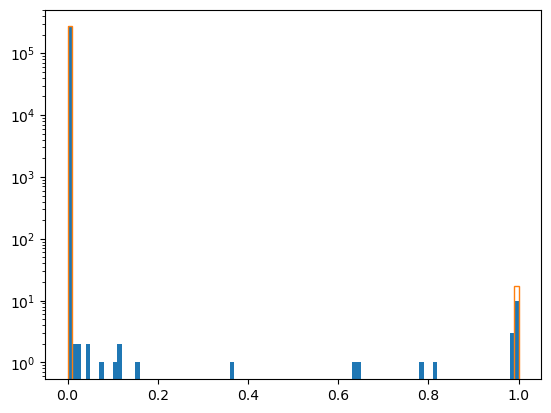

In [51]:
plt.hist((pflow_incidence_torch * inputs["is_track"].unsqueeze(1)).flatten(), bins=100)
plt.hist((truth_incidence_torch * inputs["is_track"].unsqueeze(1)).flatten(), bins=100, histtype="step")
plt.yscale("log")

In [52]:
proxy_feats_pflow_raw = get_proxy_feats(torch.from_numpy(pflow_incidence)[0].unsqueeze(0), inputs, class_probs=pflow_class_probs)

tensor([ 1.6625,  2.8510,  2.9432, -0.6291, -1.9750, -0.5534, -0.6501,  1.2881,
        -0.2559, -1.2631, -0.7323, -0.2676, -0.7102, -0.3387, -0.4386, -0.2819,
        -0.3337,  1.6852, -0.3528, -0.2719, -0.3975, -0.4502,  1.6628, -1.2082,
         1.3187,  1.2961])


In [53]:
proxy_feats_pflow_raw[0, :, 2].numpy()[pflow_class[0] < 3]

array([ 1.4897509 ,  2.8093932 ,  2.9401288 , -0.41869256, -0.19689023,
       -0.6192957 , -0.7508865 ,  1.169354  , -0.36045623, -0.40346298,
       -0.5253601 , -0.3258025 , -0.32505992,  1.6301636 , -0.47846523,
       -0.47846523, -0.4963837 , -0.19689023], dtype=float32)

In [56]:
proxy_data[0][..., 2][pflow_class[0] < 3]

array([ 1.4897509 , -0.19689023, -0.6192957 ,  1.169354  , -0.36045623,
       -0.40346298, -0.5253601 , -0.49638373, -0.32505992,  1.6301636 ,
       -0.40346298, -0.36045623, -0.49638373,  0.        ,  0.        ,
        0.        ,  1.4897509 ,  0.        ,  0.        ,  0.        ,
        1.6301636 ], dtype=float32)

In [124]:
truth_data[0][..., 2][truth_class[0] < 3]

array([ 1.4906439 ,  2.808515  ,  2.9395483 , -0.41939378, -0.19761974,
       -0.61850184, -0.74863285,  1.169301  , -0.36095914, -0.40338397,
       -0.5252322 , -0.32555065, -0.32595336,  1.6304138 , -0.4783316 ,
       -0.37800488, -0.49613273], dtype=float32)

In [125]:
pflow_incidence[0][pflow_incidence[0] == 1.0]

array([], dtype=float32)

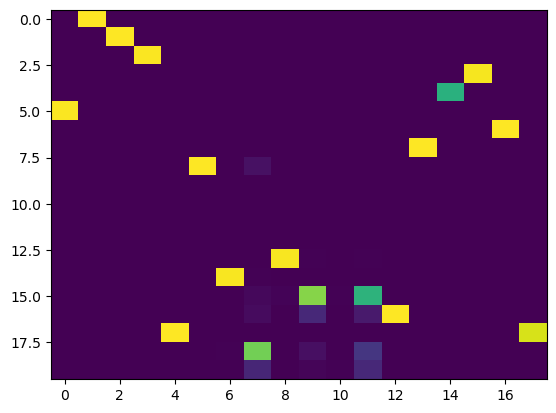

In [54]:
plt.imshow(pflow_incidence[0][:20, :18], interpolation="nearest", aspect="auto")

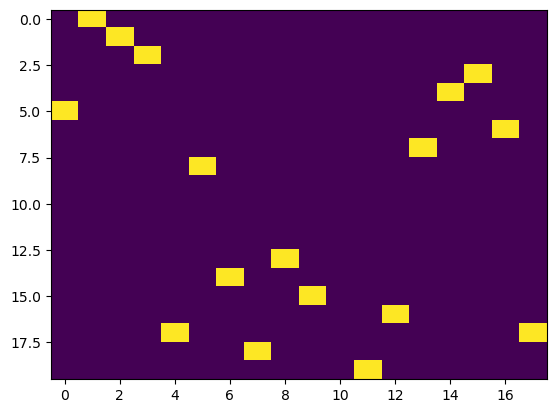

In [55]:
plt.imshow(truth_incidence[0][:20, :18], interpolation="nearest", aspect="auto")

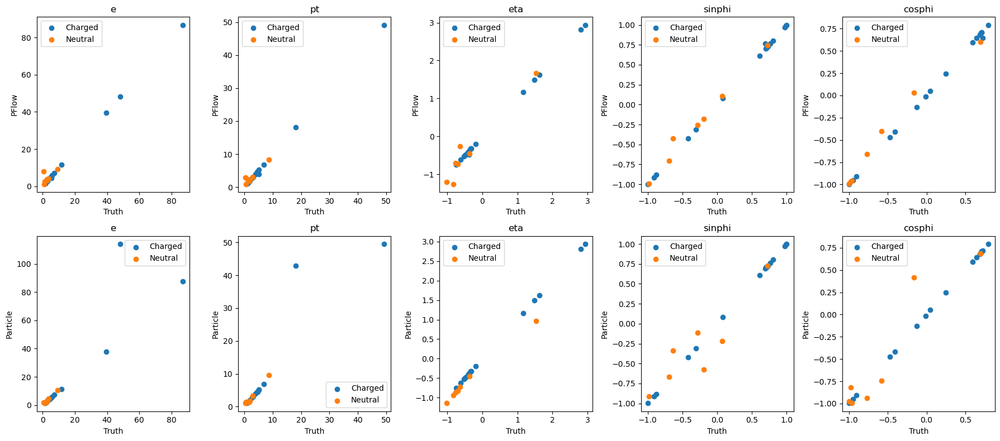

In [56]:
fig, ax = plt.subplots(2, 5, figsize=(18, 8))
mask = truth_indicator[0]
labels = ["e", "pt", "eta", "sinphi", "cosphi"]
# truth_idx = torch.argsort(proxy_feats_truth[0, :, 2][mask])
# pflow_idx = torch.argsort(proxy_feats_pflow[0, :, 2][mask])
# particle_idx = torch.argsort(particle_data[:, 2])
class_labels_ = ["Charged", "Neutral"]
charge_masks_proxy = [truth_class[0] < 3, truth_class[0] > 2]
charge_masks_particle = [particle_class < 3, (particle_class > 2) & (particle_class < 5)]
for i in range(5):
    for j in range(2):
        ax[0][i].scatter(
            proxy_feats_truth[0, :, i][mask & charge_masks_proxy[j]],
            proxy_feats_pflow[0, :, i][mask & charge_masks_proxy[j]],
            label=class_labels_[j],
        )
        ax[1][i].scatter(
            proxy_feats_truth[0, :, i][mask & charge_masks_proxy[j]],
            particle_data[:, i][charge_masks_particle[j]],
            label=class_labels_[j],
        )
    ax[0][i].set_title(labels[i])
    ax[1][i].set_title(labels[i])
    ax[0][i].set_xlabel("Truth")
    ax[0][i].set_ylabel("PFlow")
    ax[1][i].set_xlabel("Truth")
    ax[1][i].set_ylabel("Particle")
    ax[0][i].legend()
    ax[1][i].legend()
fig.tight_layout()
plt.show()

In [57]:
inc_e_weighted = torch.from_numpy(pflow_incidence)[0].unsqueeze(0) * inputs["e"]

In [58]:
inc_e_weighted.sum(-1)[0][pflow_class[0] < 5]

tensor([  0.7083,  82.3832,  40.0252,   3.9249,   7.4759,   1.6331,   1.2445,
          4.8424,   1.2558,   3.8034,   3.9810,   2.5196,   1.1197,   3.2195,
          1.7628,   7.7722,   7.7231, 111.4016,   4.1502,   2.0341,   3.4978,
          9.1319,   7.9945,   3.3064,   0.7395])

In [59]:
proxy_feats_truth[0, :, 0][pflow_class[0] < 5]

tensor([ 3.0001, 39.3892, 11.6581,  1.6921,  2.0622,  2.2915,  1.2856, 86.7757,
         1.5341,  2.7062,  3.7045,  1.4537,  0.8972,  3.0066,  5.9450,  7.1932,
         3.2353, 48.1511,  4.3701,  5.4796,  5.1238,  9.3442,  0.7624,  2.8303,
         0.0000])

In [60]:
# truth_mask = truth_indicator[0]
# pflow_mask = pflow_indicator[0]
truth_mask = truth_class[0] < 5  # & (truth_class[0] > 2)
pflow_mask = pflow_class[0] < 5  # & (pflow_class[0] > 2)

In [61]:
torch.sum(proxy_feats_truth[0, :, 2][truth_mask] > 2)

tensor(2)

In [62]:
pflow_incidence[0][0]

array([8.0443234e-09, 9.9999952e-01, 9.5094023e-08, 1.3211567e-07,
       1.3223790e-04, 1.2161666e-10, 1.0522138e-14, 1.8546268e-17,
       1.5622795e-19, 3.2214747e-17, 8.2978696e-22, 4.0780371e-17,
       1.4432608e-17, 9.5249117e-20, 5.7352931e-15, 9.2428987e-20,
       3.8828902e-11, 1.7408569e-05, 3.5419716e-12, 4.5887659e-06,
       8.8308643e-06, 1.1514982e-05, 2.8566359e-07, 9.0216570e-05,
       3.4847934e-04, 5.8817138e-09, 6.8757729e-19, 6.6728251e-12,
       3.0316689e-12, 5.2589606e-03, 1.2418749e-12, 8.0408172e-05,
       4.9636913e-14, 3.7128692e-11, 1.7603369e-04, 6.3258678e-15,
       1.7888797e-04, 2.7083533e-07, 3.0557982e-05, 2.9786024e-04,
       2.4942683e-08, 1.0178254e-02, 1.4615381e-06, 4.3497630e-03,
       1.0084748e-05, 9.7932038e-04, 1.6346980e-13, 4.5613952e-13,
       6.0566127e-12, 3.6955917e-11, 1.8973421e-13, 7.6346027e-11,
       2.0795907e-22, 3.3209435e-16, 1.7808285e-05, 9.9974543e-01,
       5.0494433e-03, 4.1399294e-18, 2.9580001e-04, 2.2302194e

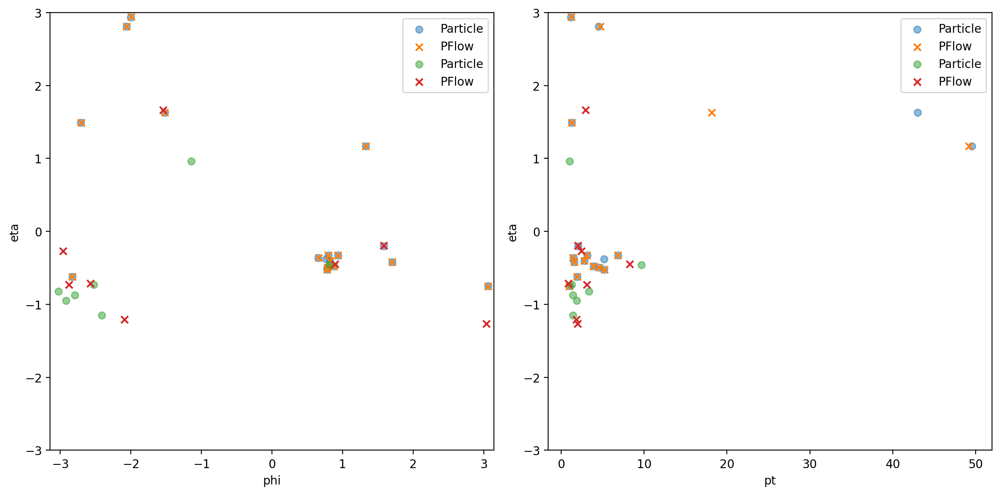

In [63]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=200)
for _i, (pr_charge_mask, tr_charge_mask) in enumerate(zip(charge_masks_proxy, charge_masks_particle, strict=False)):
    # ax[0].scatter(
    #     torch.atan2(proxy_feats_truth[0, :, 3], proxy_feats_truth[0, :, 4])[truth_mask & tr_charge_mask],
    #     proxy_feats_truth[0, :, 2][truth_mask & tr_charge_mask],
    #     label="Truth",
    #     marker="s",
    #     facecolors="none",
    #     color="g",
    # )
    ax[0].scatter(
        torch.arctan2(particle_data[:, 3], particle_data[:, 4])[tr_charge_mask], particle_data[:, 2][tr_charge_mask], label="Particle", alpha=0.5
    )
    ax[0].scatter(
        torch.atan2(proxy_feats_pflow[0, :, 3], proxy_feats_pflow[0, :, 4])[pflow_mask & pr_charge_mask],
        proxy_feats_pflow[0, :, 2][pflow_mask & pr_charge_mask],
        marker="x",
        label="PFlow",
    )
    ax[0].set_xlabel("phi")
    ax[0].set_ylabel("eta")
    ax[1].scatter(particle_data[:, 1][tr_charge_mask], particle_data[:, 2][tr_charge_mask], label="Particle", alpha=0.5)
    # ax[1].scatter(
    #     proxy_feats_truth[0, :, 1][truth_mask],
    #     proxy_feats_truth[0, :, 2][truth_mask],
    #     label="Truth",
    #     marker="s",
    #     facecolors="none",
    #     color="g",
    # )
    ax[1].scatter(
        proxy_feats_pflow[0, :, 1][pflow_mask & pr_charge_mask],
        proxy_feats_pflow[0, :, 2][pflow_mask & pr_charge_mask],
        marker="x",
        label="PFlow",
    )
ax[1].set_xlabel("pt")
ax[1].set_ylabel("eta")
ax[0].legend()
ax[1].legend()
ax[0].set_xlim(-np.pi, np.pi)
ax[0].set_ylim(-3, 3)
ax[1].set_ylim(-3, 3)
fig.tight_layout()
plt.show()

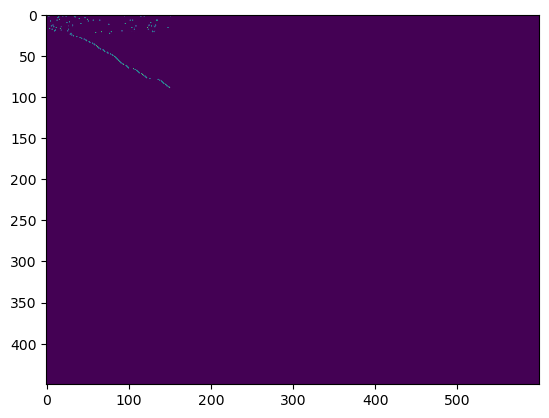

In [64]:
plt.imshow(truth_incidence[0])

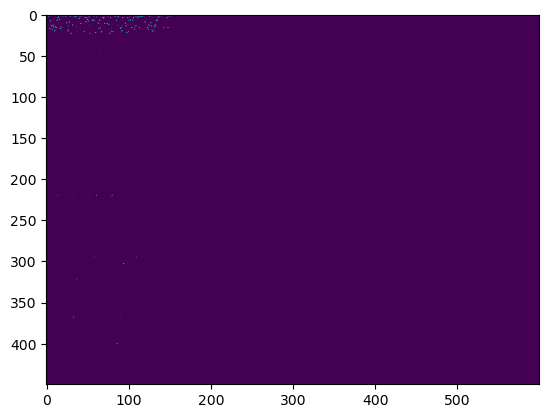

In [65]:
plt.imshow(pflow_incidence[0])

In [66]:
def calc_n_particles(pflow_indicator, truth_indicator, ind_threshold=0.5):
    n_pflow = []
    n_truth = []
    n_proxy = []
    for i in range(len(pflow_ptetaphi)):
        n_pflow.append((pflow_indicator[i] > ind_threshold).sum())
        n_proxy.append((pflow_indicator[i] > ind_threshold).sum())
        n_truth.append((truth_indicator[i] > ind_threshold).sum())
    return n_pflow, n_truth, n_proxy

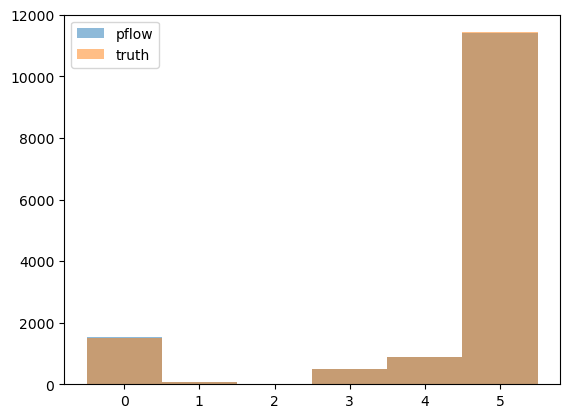

In [67]:
plt.hist(pflow_class.flatten(), bins=np.arange(-0.5, 6.5), alpha=0.5, label="pflow")
plt.hist(truth_class.flatten(), bins=np.arange(-0.5, 6.5), alpha=0.5, label="truth")
# plt.yscale('log')
plt.legend()
plt.show()

In [68]:
n_pflow, n_truth, n_proxy = calc_n_particles(pflow_indicator, truth_indicator, ind_threshold=0.5)

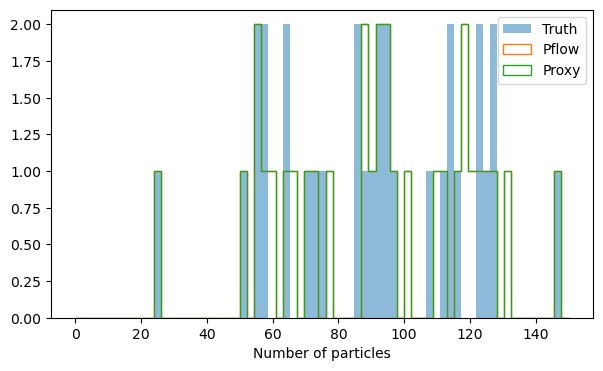

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))

npart_bins = np.linspace(0, 150, 70)
ax.hist(
    n_truth,
    bins=npart_bins,
    histtype="stepfilled",
    alpha=0.5,
    label="Truth",
)
ax.hist(
    n_pflow,
    bins=npart_bins,
    histtype="step",
    label="Pflow",
)
ax.hist(
    n_proxy,
    bins=npart_bins,
    histtype="step",
    label="Proxy",
)
ax.legend()
ax.set_xlabel("Number of particles")
plt.show()

In [70]:
pflow_indicator = (pflow_class < 5) & (np.abs(pflow_ptetaphi[..., 1]) < 3)
# pflow_indicator = (np.abs(pflow_ptetaphi[..., 1]) < 3) & (pflow_indicator_prob > 0.7)

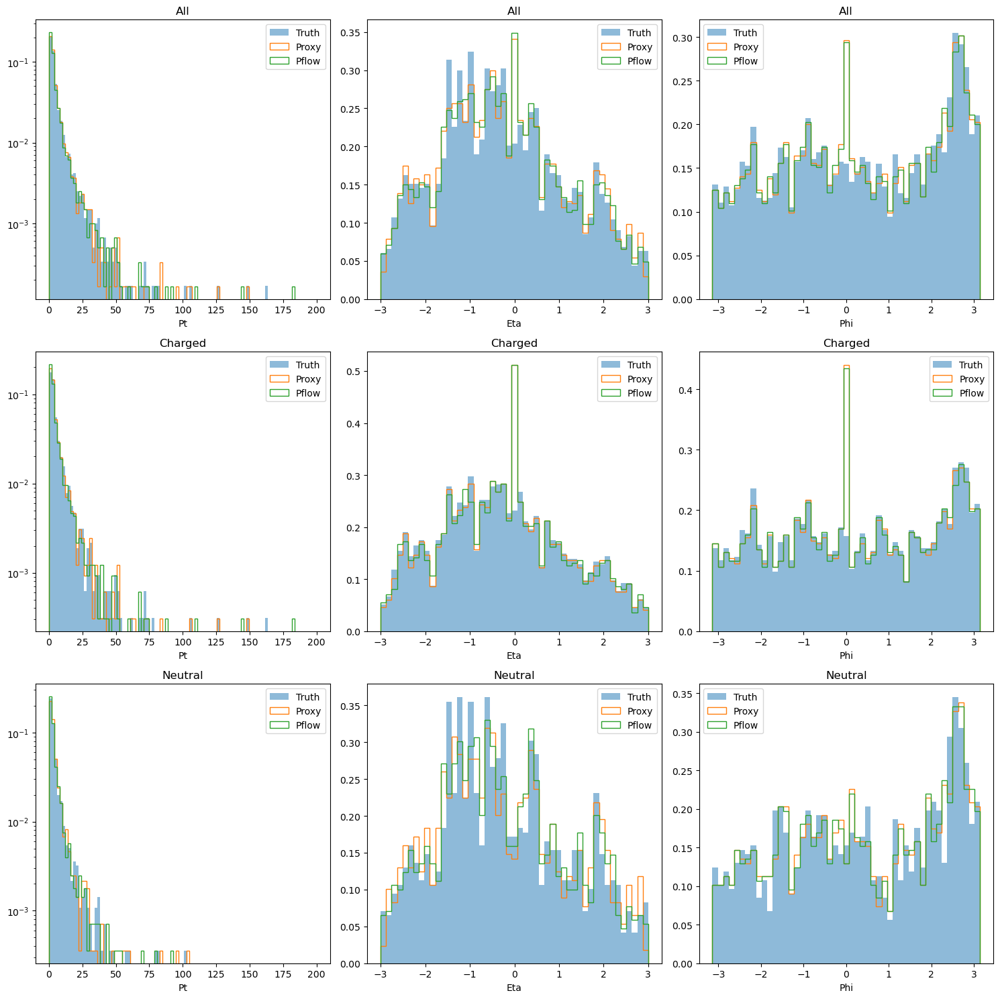

In [71]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
ind_threshold = 0.65
bins = [
    np.linspace(0, 200, 100),
    np.linspace(-3, 3, 50),
    np.linspace(-np.pi, np.pi, 50),
]

truth_charge_masks = [
    (np.concatenate(truth_class) < 5) & (np.concatenate(truth_indicator) > ind_threshold),
    (np.concatenate(truth_class) < 3) & (np.concatenate(truth_indicator) > ind_threshold),
    (np.concatenate(truth_class) < 5) & (np.concatenate(truth_class) > 2) & (np.concatenate(truth_indicator) > ind_threshold),
]
pflow_charge_masks = [
    (np.concatenate(pflow_class) < 5) & (np.concatenate(pflow_indicator) > ind_threshold),
    (np.concatenate(pflow_class) < 3) & (np.concatenate(pflow_indicator) > ind_threshold),
    (np.concatenate(pflow_class) < 5) & (np.concatenate(pflow_class) > 2) & (np.concatenate(pflow_indicator) > ind_threshold),
]
scale = 1
for i in range(3):
    for j, plot_type in enumerate(["All", "Charged", "Neutral"]):
        truth_feats = np.concatenate(truth_ptetaphi)[:, i][truth_charge_masks[j]]
        pflow_feats = np.concatenate(pflow_ptetaphi)[:, i][pflow_charge_masks[j]]
        proxy_feats = np.concatenate(proxy_ptetaphi)[:, i][pflow_charge_masks[j]]
        ax[j][i].hist(
            truth_feats * scale,
            bins=bins[i],
            histtype="stepfilled",
            alpha=0.5,
            label="Truth",
            density=True,
        )
        ax[j][i].hist(
            proxy_feats * scale,
            bins=bins[i],
            histtype="step",
            label="Proxy",
            density=True,
        )
        ax[j][i].hist(
            pflow_feats * scale,  # * 0.85 if (i == 0) and (j == 2) else pflow_feats * scale,
            bins=bins[i],
            histtype="step",
            label="Pflow",
            density=True,
        )
        ax[j][i].set_xlabel(["Pt", "Eta", "Phi"][i])
        if i == 0:
            ax[j][i].set_yscale("log")
        ax[j][i].set_title(plot_type)
        ax[j][i].legend()
fig.tight_layout()
plt.show()

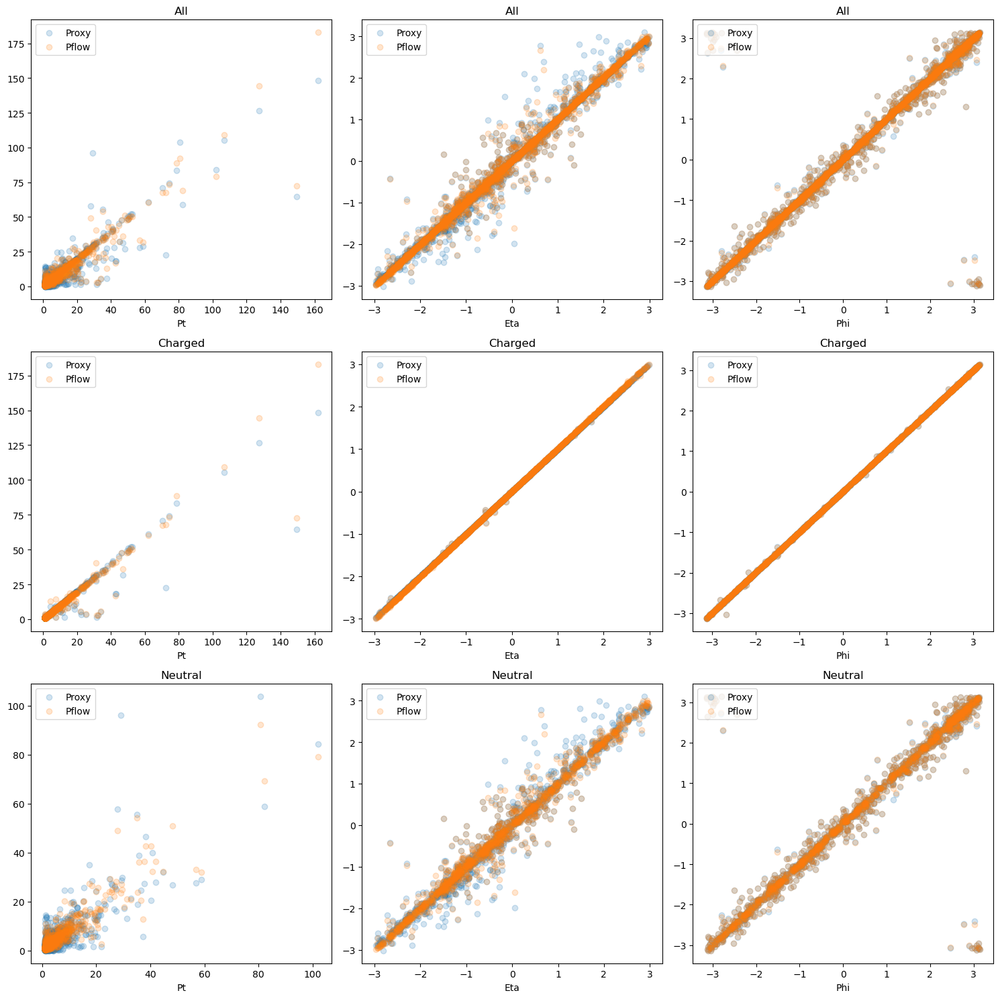

In [72]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
ind_threshold = 0.65
bins = [
    np.linspace(0, 200, 100),
    np.linspace(-3, 3, 50),
    np.linspace(-np.pi, np.pi, 50),
]

charge_masks = [
    (np.concatenate(pflow_indicator) > ind_threshold) & (np.concatenate(truth_indicator) > ind_threshold),
    (np.concatenate(pflow_indicator) > ind_threshold)
    & (np.concatenate(truth_indicator) > ind_threshold)
    & (np.concatenate(pflow_class) < 3)
    & (np.concatenate(truth_class) < 3),
    (np.concatenate(pflow_indicator) > ind_threshold)
    & (np.concatenate(truth_indicator) > ind_threshold)
    & (np.concatenate(pflow_class) > 2)
    & (np.concatenate(truth_class) > 2),
]
scale = 1
for i in range(3):
    for j, plot_type in enumerate(["All", "Charged", "Neutral"]):
        truth_feats = np.concatenate(truth_ptetaphi)[:, i][charge_masks[j]]
        pflow_feats = np.concatenate(pflow_ptetaphi)[:, i][charge_masks[j]]
        proxy_feats = np.concatenate(proxy_ptetaphi)[:, i][charge_masks[j]]
        ax[j][i].scatter(
            truth_feats * scale,
            proxy_feats * scale,
            alpha=0.2,
            label="Proxy",
        )
        ax[j][i].scatter(
            truth_feats * scale,
            pflow_feats * scale,
            alpha=0.2,
            label="Pflow",
        )
        ax[j][i].set_xlabel(["Pt", "Eta", "Phi"][i])
        ax[j][i].set_title(plot_type)
        ax[j][i].legend(loc="upper left")
fig.tight_layout()
plt.show()

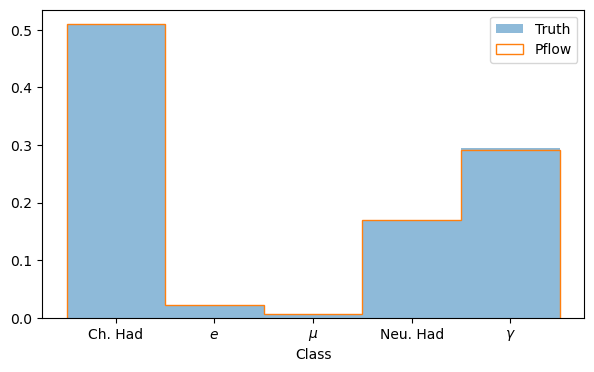

In [73]:
class_labels = ["Ch. Had", "$e$", r"$\mu$", "Neu. Had", r"$\gamma$"]
# confusion matrix
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
ax.hist(
    np.concatenate(truth_class)[np.concatenate(truth_indicator) > 0.5],
    bins=np.arange(0, 6) - 0.5,
    histtype="stepfilled",
    alpha=0.5,
    label="Truth",
    density=True,
)
ax.hist(
    np.concatenate(pflow_class)[np.concatenate(pflow_indicator) > 0.5],
    bins=np.arange(0, 6) - 0.5,
    histtype="step",
    label="Pflow",
    density=True,
)
ax.set_xlabel("Class")
ax.set_xticks(np.arange(5))
ax.set_xticklabels(class_labels)
ax.legend()
plt.show()

In [74]:
import awkward as ak
import fastjet as fj

In [75]:
def normalize_phi(phi):
    return np.atan2(np.sin(phi), np.cos(phi))

In [76]:
def get_cluster_sequence(jet_definition, four_vectors, user_indices=None):
    pj_array = []

    for i, part in enumerate(four_vectors):
        pj = fj.PseudoJet(part.px.item(), part.py.item(), part.pz.item(), part.E.item())
        if user_indices is not None:
            pj.set_user_index(user_indices[i])
        else:
            pj.set_user_index(i)
        pj_array.append(pj)

    return fj.ClusterSequence(pj_array, jet_definition)

In [77]:
def get_jet_features(ptetaphi, indicator, ind_threshold=0.5):
    px = ptetaphi[:, 0][indicator > ind_threshold] * np.cos(ptetaphi[:, 2][indicator > ind_threshold])
    py = ptetaphi[:, 0][indicator > ind_threshold] * np.sin(ptetaphi[:, 2][indicator > ind_threshold])
    pz = ptetaphi[:, 0][indicator > ind_threshold] * np.sinh(ptetaphi[:, 1][indicator > ind_threshold])
    e = np.sqrt(px**2 + py**2 + pz**2)
    arr = ak.Array(
        {
            "px": px,
            "py": py,
            "pz": pz,
            "E": e,
        },
        with_name="Momentum4D",
    )
    # jetdef = fj.JetDefinition(fj.antikt_algorithm, 0.4)
    jetdef = fj.JetDefinition(fj.kt_algorithm, 0.7)
    cs = get_cluster_sequence(jetdef, arr)
    jets = fj.sorted_by_pt(cs.inclusive_jets())
    newjets = [jet for jet in jets if len(jet.constituents()) > 2 and jet.pt() > 10]
    if len(newjets) == 0:
        # return np.array([0]), np.array([0]), np.array([0]), np.array([0])
        return np.array([]), np.array([]), np.array([]), np.array([]), np.array([])
    return (
        np.array([jet.pt() for jet in newjets]),
        np.array([jet.eta() for jet in newjets]),
        np.array([normalize_phi(jet.phi()) for jet in newjets]),
        np.array([jet.m() for jet in newjets]),
        np.array([len(jet.constituents()) for jet in newjets]),
    )

In [78]:
ind_threshold = 0.5

In [79]:
def to_object_array(x):
    return np.array(x, dtype=object)

In [80]:
pflow_indicator = (pflow_class < 5) & (np.abs(pflow_ptetaphi[..., 1]) < 3)
# pflow_indicator = (np.abs(pflow_ptetaphi[..., 1]) < 3) & (pflow_indicator_prob > 0.7)
truth_indicator = (truth_class < 5) & (np.abs(truth_ptetaphi[..., 1]) < 3)

In [81]:
pflow_jet_pt, pflow_jet_eta, pflow_jet_phi, pflow_jet_mass, pflow_jet_nconst = map(
    to_object_array,
    zip(
        *[
            get_jet_features(ptetaphi, indicator, ind_threshold=ind_threshold)
            for ptetaphi, indicator in zip(pflow_ptetaphi, pflow_indicator, strict=False)
        ],
        strict=False,
    ),
)
truth_jet_pt, truth_jet_eta, truth_jet_phi, truth_jet_mass, truth_jet_nconst = map(
    to_object_array,
    zip(
        *[
            get_jet_features(ptetaphi, indicator, ind_threshold=ind_threshold)
            for ptetaphi, indicator in zip(truth_ptetaphi, truth_indicator, strict=False)
        ],
        strict=False,
    ),
)
proxy_jet_pt, proxy_jet_eta, proxy_jet_phi, proxy_jet_mass, proxy_jet_nconst = map(
    to_object_array,
    zip(
        *[
            get_jet_features(ptetaphi, indicator, ind_threshold=ind_threshold)
            for ptetaphi, indicator in zip(proxy_ptetaphi, pflow_indicator, strict=False)
        ],
        strict=False,
    ),
)

#--------------------------------------------------------------------------
#                         FastJet release 3.4.0
#                 M. Cacciari, G.P. Salam and G. Soyez                  
#     A software package for jet finding and analysis at colliders      
#                           http://fastjet.fr                           
#	                                                                      
# Please cite EPJC72(2012)1896 [arXiv:1111.6097] if you use this package
# for scientific work and optionally PLB641(2006)57 [hep-ph/0512210].   
#                                                                       
# FastJet is provided without warranty under the GNU GPL v2 or higher.  
# It uses T. Chan's closest pair algorithm, S. Fortune's Voronoi code,
# CGAL and 3rd party plugin jet algorithms. See COPYING file for details.
#--------------------------------------------------------------------------


In [82]:
truth_jet_pt[0]

array([42.61542358, 11.9692328 ])

In [83]:
def matching(input_pt, input_eta, input_phi, truth_pt, truth_eta, truth_phi, dr_cut=0.4):
    def mse(a, b):
        return (a - b) ** 2

    input_indices = []
    truth_indices = []
    hung_cost = np.zeros(len(input_phi))

    for i in tqdm(range(len(input_phi)), desc="matching"):
        mask = input_pt[i] > 0
        tr_mask = truth_pt[i] > 0
        input_eta_i = input_eta[i][mask]
        input_phi_i = input_phi[i][mask]

        truth_eta_i = truth_eta[i][tr_mask]
        truth_phi_i = truth_phi[i][tr_mask]

        truth_eta_i = np.tile(np.expand_dims(truth_eta_i, axis=1), (1, len(input_eta_i)))  # row content same
        input_eta_i = np.tile(np.expand_dims(input_eta_i, axis=0), (len(truth_eta_i), 1))  # column content same

        truth_phi_i = np.tile(np.expand_dims(truth_phi_i, axis=1), (1, len(input_phi_i)))  # row content same
        input_phi_i = np.tile(np.expand_dims(input_phi_i, axis=0), (len(truth_phi_i), 1))  # column content same

        loss_phi = mse(truth_phi_i, input_phi_i)
        loss_eta = mse(truth_eta_i, input_eta_i)

        loss = np.sqrt(loss_eta + loss_phi)
        loss_hung = loss.copy()

        # loss[loss == np.inf] = 1000
        # loss[loss == np.nan] = 1000
        # truth_ix, input_ix = linear_sum_assignment(loss)

        # indices = input_ix.shape[0] * truth_ix + input_ix

        # loss_extract = np.take_along_axis(loss_hung.flatten(), indices, axis=0)

        # hung_cost[i] = loss_extract.mean()

        dr = np.sqrt(loss_eta + loss_phi)
        loss[dr > dr_cut] = 1e3

        loss[loss == np.inf] = 1000
        loss[loss == np.nan] = 1000
        truth_ix, input_ix = linear_sum_assignment(loss)

        # Create boolean mask for dr < 0.6
        mask = dr <= dr_cut

        # Find all pairs (i, j) where dr < 0.6
        filtered_pairs = np.argwhere(mask)

        # Convert truth_ix and input_ix into sets for fast lookups
        truth_input_pairs = set(zip(truth_ix, input_ix, strict=False))

        # Select new pairs where (i, j) are in the filtered_pairs and truth_input_pairs
        new_pairs = np.array([pair for pair in filtered_pairs if tuple(pair) in truth_input_pairs])

        # Split new pairs into new_truth_ix and new_input_ix
        if len(new_pairs) == 0:
            new_truth_ix = []
            new_input_ix = []
        else:
            new_truth_ix, new_input_ix = new_pairs.T

        input_ix = np.array(new_input_ix)
        truth_ix = np.array(new_truth_ix)

        if len(new_pairs) == 0:
            hung_cost[i] = 1000
            # print(i)
        else:
            indices = input_ix.shape[0] * truth_ix + input_ix
            loss_extract = np.take_along_axis(loss_hung.flatten(), indices, axis=0)
            hung_cost[i] = loss_extract.mean()
        input_indices.append(input_ix)
        truth_indices.append(truth_ix)

    print("Matching done!")

    return (
        np.array(truth_indices, dtype=object),
        np.array(input_indices, dtype=object),
        hung_cost,
    )

In [84]:
tr_pf_indices, pf_indices, hung_cost = matching(
    pflow_jet_pt,
    pflow_jet_eta,
    pflow_jet_phi,
    truth_jet_pt,
    truth_jet_eta,
    truth_jet_phi,
)
if not np.allclose(proxy_data[..., 0], 0):
    tr_pr_indices, pr_indices, hung_cost = matching(
        proxy_jet_pt,
        proxy_jet_eta,
        proxy_jet_phi,
        truth_jet_pt,
        truth_jet_eta,
        truth_jet_phi,
    )

matching: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 9423.42it/s]


Matching done!


matching: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 9850.84it/s]

Matching done!


In [85]:
def get_residuals(
    truth_indices,
    pred_indices,
    truth_pt,
    truth_eta,
    truth_phi,
    pred_pt,
    pred_eta,
    pred_phi,
):
    res_pt = []
    res_eta = []
    res_phi = []

    for i in range(len(truth_indices)):
        if len(truth_indices[i]) == 0 or len(pred_indices[i]) == 0:
            continue
        res_pt.append((pred_pt[i][pred_indices[i]] - truth_pt[i][truth_indices[i]]) / truth_pt[i][truth_indices[i]])
        res_eta.append(pred_eta[i][pred_indices[i]] - truth_eta[i][truth_indices[i]])
        res_phi.append(pred_phi[i][pred_indices[i]] - truth_phi[i][truth_indices[i]])

    return np.concatenate(res_pt), np.concatenate(res_eta), np.concatenate(res_phi)

In [86]:
n_pflow_jets = np.array([len(el) for el in pflow_jet_pt])
n_truth_jets = np.array([len(el) for el in truth_jet_pt])
n_proxy_jets = np.array([len(el) for el in proxy_jet_pt])
# n_hgpf_jets = np.array([len(el) for el in hgpf_jet_pt])
mask = (
    (n_pflow_jets > 0) & (n_truth_jets > 0) if np.allclose(proxy_data[..., 0], 0) else (n_pflow_jets > 0) & (n_truth_jets > 0) & (n_proxy_jets > 0)
)  # & (n_hgpf_jets > 0)

In [87]:
pflow_tr_res_pt, pflow_tr_res_eta, pflow_tr_res_phi = get_residuals(
    tr_pf_indices[mask],
    pf_indices[mask],
    truth_jet_pt[mask],
    truth_jet_eta[mask],
    truth_jet_phi[mask],
    pflow_jet_pt[mask],
    pflow_jet_eta[mask],
    pflow_jet_phi[mask],
)
if not np.allclose(proxy_data[..., 0], 0):
    proxy_tr_res_pt, proxy_tr_res_eta, proxy_tr_res_phi = get_residuals(
        tr_pr_indices[mask],
        pr_indices[mask],
        truth_jet_pt[mask],
        truth_jet_eta[mask],
        truth_jet_phi[mask],
        proxy_jet_pt[mask],
        proxy_jet_eta[mask],
        proxy_jet_phi[mask],
    )

In [88]:
def get_jet_nconst(jet_nconst):
    nconst = []
    for el in jet_nconst:
        if len(el) == 0:
            continue
        nconst.append(el[0])
    return np.array(nconst)

In [89]:
from scipy.stats import iqr

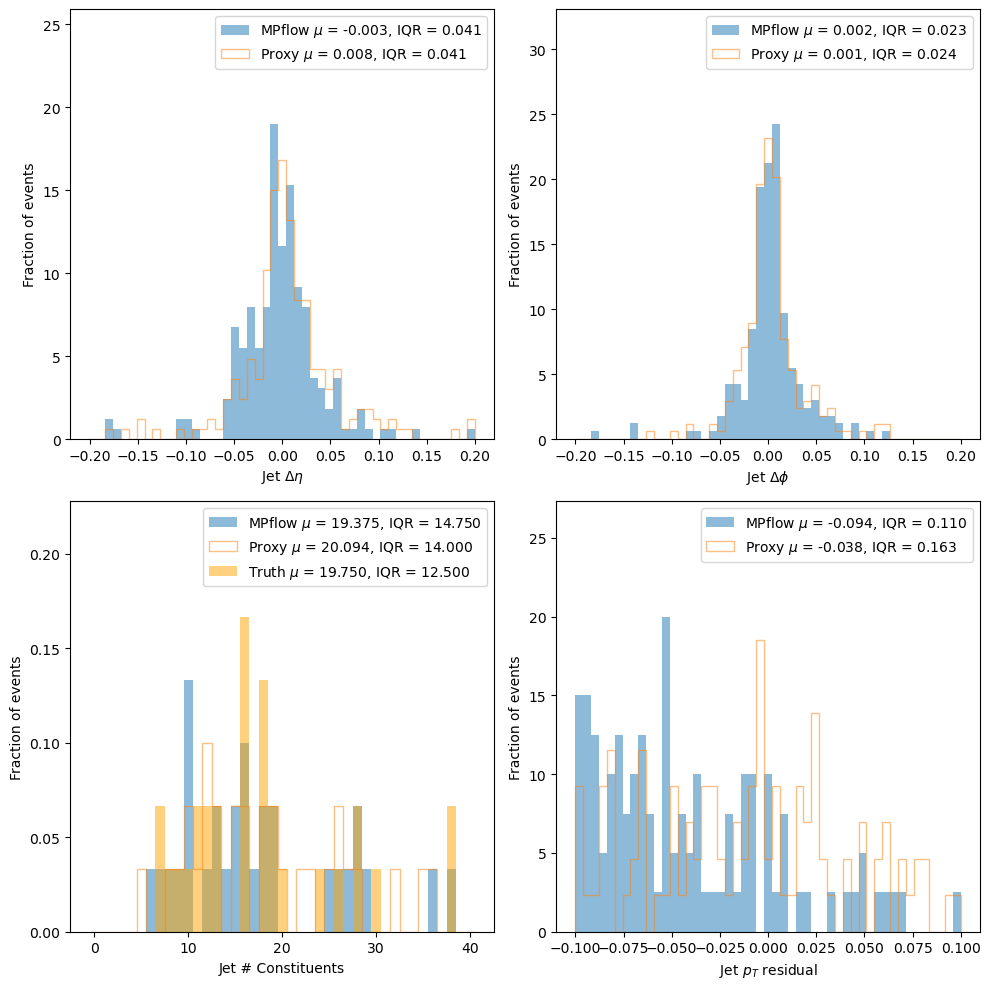

In [90]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

bins = [
    np.linspace(-0.2, 0.2, 50),
    np.linspace(-0.2, 0.2, 50),
    np.linspace(-0.5, 40.5, 42),
    np.linspace(-0.1, 0.1, 50),
]
data_arr = [
    pflow_tr_res_eta,
    pflow_tr_res_phi,
    get_jet_nconst(pflow_jet_nconst),
    pflow_tr_res_pt,
]
if not np.allclose(proxy_data[..., 0], 0):
    proxy_data_arr = [
        proxy_tr_res_eta,
        proxy_tr_res_phi,
        get_jet_nconst(proxy_jet_nconst),
        proxy_tr_res_pt,
    ]

for i in range(4):
    ax[i // 2, i % 2].hist(
        data_arr[i],
        bins=bins[i],
        histtype="stepfilled",
        alpha=0.5,
        density=True,
        label=rf"MPflow $\mu$ = {np.mean(data_arr[i]):.3f}, IQR = {iqr(data_arr[i]):.3f}",
    )
    if not np.allclose(proxy_data[..., 0], 0):
        ax[i // 2, i % 2].hist(
            proxy_data_arr[i],
            bins=bins[i],
            histtype="step",
            alpha=0.5,
            density=True,
            label=rf"Proxy $\mu$ = {np.mean(proxy_data_arr[i]):.3f}, IQR = {iqr(proxy_data_arr[i]):.3f}",
        )

    ax[i // 2, i % 2].set_xlabel(
        [
            r"Jet $\Delta\eta$",
            r"Jet $\Delta\phi$",
            "Jet # Constituents",
            "Jet $p_T$ residual",
        ][i]
    )
    if i == 2:
        truth_nconst = get_jet_nconst(truth_jet_nconst)
        ax[1, 0].hist(
            truth_nconst,
            bins=bins[2],
            histtype="stepfilled",
            alpha=0.5,
            label=rf"Truth $\mu$ = {np.mean(truth_nconst):.3f}, IQR = {iqr(truth_nconst):.3f}",
            color="orange",
            density=True,
        )
    ax[i // 2, i % 2].set_ylabel("Fraction of events")
    ymin, ymax = ax[i // 2, i % 2].get_ylim()
    ax[i // 2, i % 2].set_ylim(ymin, ymax * 1.3)
    ax[i // 2, i % 2].legend(loc="upper right")
fig.tight_layout()

In [91]:
def plot_pt(ax, pt, eta, phi, shift, color="k"):
    center_phi, center_eta = normalize_phi(phi), eta
    ax.text(
        center_phi + shift[0],
        center_eta + shift[1],
        f"{pt:.2f} GeV",
        ha="center",
        va="center",
        color=color,
    )

In [92]:
def plot_event(
    pflow_ptetaphi,
    pflow_class,
    pflow_ind,
    truth_ptetaphi,
    truth_class,
    truth_ind,
    pflow_jet_pt,
    pflow_jet_eta,
    pflow_jet_phi,
    truth_jet_pt,
    truth_jet_eta,
    truth_jet_phi,
    idx,
    ind_threshold,
    proxy_ptetaphi=None,
):
    _fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    pf_mask = pflow_ind[idx] > ind_threshold
    truth_mask = truth_ind[idx] > ind_threshold
    classes = ["Ch H", "El", "Mu", "Neut H", "Phot"]
    colors = ["red", "blue", "green", "orange", "purple"]
    for i in range(len(classes)):
        pf_class_mask = pflow_class[idx] == i
        tr_class_mask = truth_class[idx] == i
        ax.scatter(
            normalize_phi(pflow_ptetaphi[idx][:, 2][pf_mask & pf_class_mask]),
            pflow_ptetaphi[idx][:, 1][pf_mask & pf_class_mask],
            # alpha=0.5,
            s=pflow_ptetaphi[idx][:, 0][pf_mask & pf_class_mask] * 10,
            marker="x",
            color=colors[i],
        )
        ax.scatter(
            normalize_phi(truth_ptetaphi[idx][:, 2][truth_mask & tr_class_mask]),
            truth_ptetaphi[idx][:, 1][truth_mask & tr_class_mask],
            alpha=0.5,
            s=truth_ptetaphi[idx][:, 0][truth_mask & tr_class_mask] * 10,
            color=colors[i],
        )
        if proxy_ptetaphi is not None:
            ax.scatter(
                normalize_phi(proxy_ptetaphi[idx][:, 2][pf_mask & pf_class_mask]),
                proxy_ptetaphi[idx][:, 1][pf_mask & pf_class_mask],
                # alpha=0.5,
                s=proxy_ptetaphi[idx][:, 0][pf_mask & pf_class_mask] * 10,
                marker="s",
                facecolors="none",
                color=colors[i],
            )

    # draw circle
    for jet_idx in range(len(truth_jet_phi[idx])):
        circle = plt.Circle(
            (truth_jet_phi[idx][jet_idx], truth_jet_eta[idx][jet_idx]),
            0.4,
            color="k",
            fill=False,
        )
        ax.add_artist(circle)
    for jet_idx in range(len(pflow_jet_phi[idx])):
        circle = plt.Circle(
            (pflow_jet_phi[idx][jet_idx], pflow_jet_eta[idx][jet_idx]),
            0.4,
            color="r",
            fill=False,
        )
        ax.add_artist(circle)

    for jet_idx in range(len(pflow_jet_phi[idx])):
        plot_pt(
            ax,
            pflow_jet_pt[idx][jet_idx],
            pflow_jet_eta[idx][jet_idx],
            pflow_jet_phi[idx][jet_idx],
            shift=(-0.34, -0.4),
            color="r",
        )
    for jet_idx in range(len(truth_jet_phi[idx])):
        plot_pt(
            ax,
            truth_jet_pt[idx][jet_idx],
            truth_jet_eta[idx][jet_idx],
            truth_jet_phi[idx][jet_idx],
            shift=(0.34, 0.46),
            color="k",
        )

    legend_handles = [plt.Line2D([0], [0], marker="o", color=colors[i], label=c) for i, c in enumerate(classes)]
    ax.set_xlim(-np.pi, np.pi)
    ax.set_ylim(-3, 3)
    ax.legend(handles=legend_handles)
    ax.set_xlabel("Phi")
    ax.set_ylabel("Eta")
    # ax.legend()
    plt.show()

In [93]:
def plot_event_splitted(
    pflow_ptetaphi,
    pflow_class,
    pflow_ind,
    truth_ptetaphi,
    truth_class,
    truth_ind,
    pflow_jet_pt=None,
    pflow_jet_eta=None,
    pflow_jet_phi=None,
    truth_jet_pt=None,
    truth_jet_eta=None,
    truth_jet_phi=None,
    idx=0,
    ind_threshold=0.5,
    proxy_ptetaphi=None,
):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=200)
    pf_mask = pflow_ind[idx] > ind_threshold
    tr_mask = truth_ind[idx] > ind_threshold

    classes = ["Ch H", "El", "Mu", "Neut H", "Phot"]
    colors = ["red", "blue", "green", "orange", "purple"]
    for i in range(len(classes)):
        pf_class_mask = pflow_class[idx] == i
        tr_class_mask = truth_class[idx] == i
        ax[0].scatter(
            normalize_phi(truth_ptetaphi[idx][:, 2][tr_mask & tr_class_mask]),
            truth_ptetaphi[idx][:, 1][tr_mask & tr_class_mask],
            alpha=0.3,
            color=colors[i],
        )
        ax[0].scatter(
            normalize_phi(pflow_ptetaphi[idx][:, 2][pf_mask & pf_class_mask]),
            pflow_ptetaphi[idx][:, 1][pf_mask & pf_class_mask],
            # alpha=0.5,
            marker="x",
            color=colors[i],
        )
        ax[1].scatter(
            truth_ptetaphi[idx][:, 0][tr_mask & tr_class_mask],
            truth_ptetaphi[idx][:, 1][tr_mask & tr_class_mask],
            alpha=0.3,
            color=colors[i],
        )
        ax[1].scatter(
            pflow_ptetaphi[idx][:, 0][pf_mask & pf_class_mask],
            pflow_ptetaphi[idx][:, 1][pf_mask & pf_class_mask],
            # alpha=0.5,
            marker="x",
            color=colors[i],
        )
        if proxy_ptetaphi is not None:
            ax[0].scatter(
                normalize_phi(proxy_ptetaphi[idx][:, 2][pf_mask & pf_class_mask]),
                proxy_ptetaphi[idx][:, 1][pf_mask & pf_class_mask],
                # alpha=0.5,
                marker="s",
                facecolors="none",
                color=colors[i],
            )
            ax[1].scatter(
                proxy_ptetaphi[idx][:, 0][pf_mask & pf_class_mask],
                proxy_ptetaphi[idx][:, 1][pf_mask & pf_class_mask],
                # alpha=0.5,
                marker="s",
                facecolors="none",
                color=colors[i],
            )
    if truth_jet_phi is not None:
        for jet_idx in range(len(truth_jet_phi[idx])):
            circle = plt.Circle(
                (truth_jet_phi[idx][jet_idx], truth_jet_eta[idx][jet_idx]),
                0.4,
                color="k",
                fill=False,
            )
            ax[0].add_artist(circle)
        for jet_idx in range(len(truth_jet_phi[idx])):
            plot_pt(
                ax[0],
                truth_jet_pt[idx][jet_idx],
                truth_jet_eta[idx][jet_idx],
                truth_jet_phi[idx][jet_idx],
                shift=(0.34, 0.46),
                color="k",
            )

    if pflow_jet_phi is not None:
        for jet_idx in range(len(pflow_jet_phi[idx])):
            circle = plt.Circle(
                (pflow_jet_phi[idx][jet_idx], pflow_jet_eta[idx][jet_idx]),
                0.4,
                color="r",
                fill=False,
            )
            ax[0].add_artist(circle)

        for jet_idx in range(len(pflow_jet_phi[idx])):
            plot_pt(
                ax[0],
                pflow_jet_pt[idx][jet_idx],
                pflow_jet_eta[idx][jet_idx],
                pflow_jet_phi[idx][jet_idx],
                shift=(-0.34, -0.4),
                color="r",
            )
    legend_handles = [plt.Line2D([0], [0], marker="o", color=colors[i], label=c) for i, c in enumerate(classes)]
    ax[0].legend(handles=legend_handles)
    ax[0].set_xlabel("Phi")
    ax[0].set_ylabel("Eta")
    ax[1].set_xlabel("Pt")
    ax[1].set_ylabel("Eta")
    ax[1].legend()

    ax[0].set_xlim(-np.pi, np.pi)
    ax[0].set_ylim(-3, 3)

    ax[1].set_ylim(-3, 3)
    fig.tight_layout()
    plt.show()

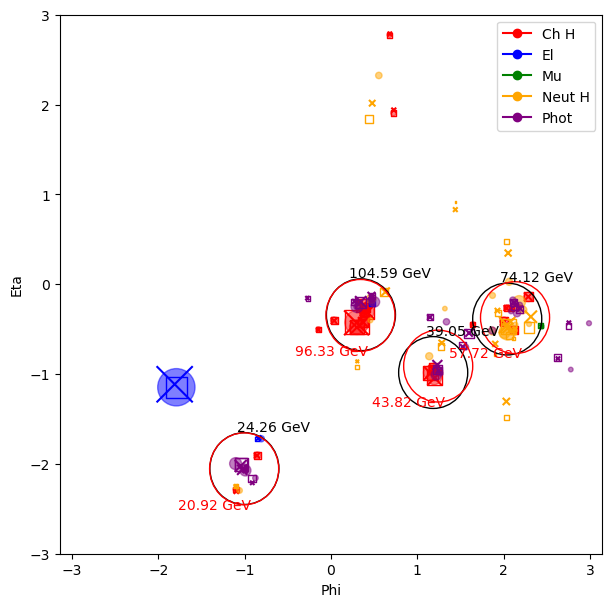

In [94]:
plot_event(
    pflow_ptetaphi,
    pflow_class,
    pflow_indicator,
    truth_ptetaphi,
    truth_class,
    truth_indicator,
    pflow_jet_pt,
    pflow_jet_eta,
    pflow_jet_phi,
    truth_jet_pt,
    truth_jet_eta,
    truth_jet_phi,
    idx=1,
    ind_threshold=0.5,
    proxy_ptetaphi=proxy_ptetaphi,
)

/tmp/ipykernel_143286/2483053372.py:114: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1].legend()


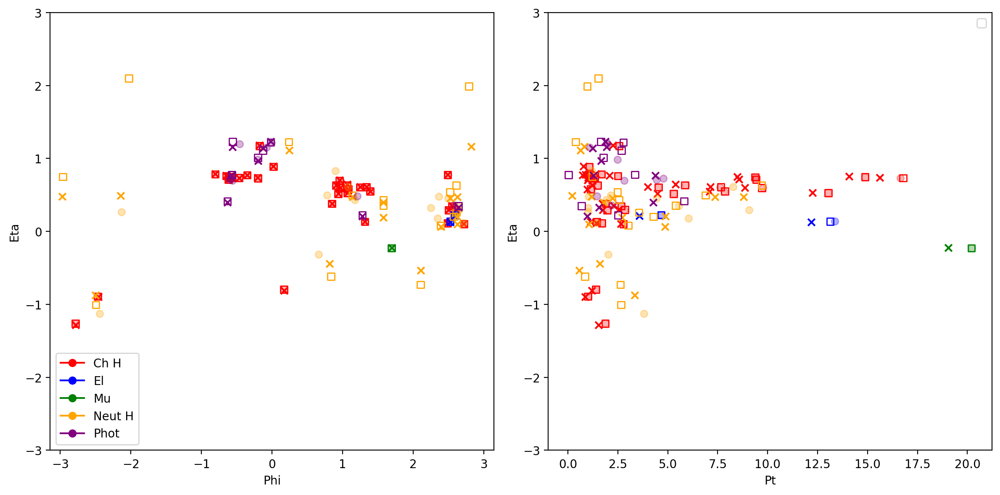

In [95]:
plot_event_splitted(
    pflow_ptetaphi,
    pflow_class,
    pflow_indicator,
    truth_ptetaphi,
    truth_class,
    truth_indicator,
    # pflow_jet_pt,
    # pflow_jet_eta,
    # pflow_jet_phi,
    # truth_jet_pt,
    # truth_jet_eta,
    # truth_jet_phi,
    idx=2,
    ind_threshold=0.5,
    proxy_ptetaphi=proxy_ptetaphi,
)

In [96]:
def plot_incidences(pflow_inc, truth_inc, idx, pflow_ind=None, truth_ind=None, ind_threshold=0.5):
    _fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    pflow_inc = pflow_inc[idx][pflow_ind[idx] > ind_threshold] if pflow_ind is not None else pflow_inc[idx]
    truth_inc = truth_inc[idx][truth_ind[idx] > ind_threshold] if truth_ind is not None else truth_inc[idx]
    ax[0].imshow(pflow_inc[:, :100], aspect="auto", vmin=0, vmax=1)
    ax[0].set_title("Pflow")
    ax[1].imshow(truth_inc[:, :100], aspect="auto", vmin=0, vmax=1)
    ax[1].set_title("Truth")
    plt.show()

In [97]:
def plot_incidence_diff(pflow_inc, truth_inc, idx, pflow_ind=None, truth_ind=None, ind_threshold=0.5):
    _fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    pflow_inc = pflow_inc[idx][pflow_ind[idx] > ind_threshold] if pflow_ind is not None else pflow_inc[idx]
    truth_inc = truth_inc[idx][truth_ind[idx] > ind_threshold] if truth_ind is not None else truth_inc[idx]
    ax.imshow(
        pflow_inc[:, :100] - truth_inc[:, :100],
        aspect="auto",
        vmin=-1,
        vmax=1,
        cmap="coolwarm",
    )
    plt.show()

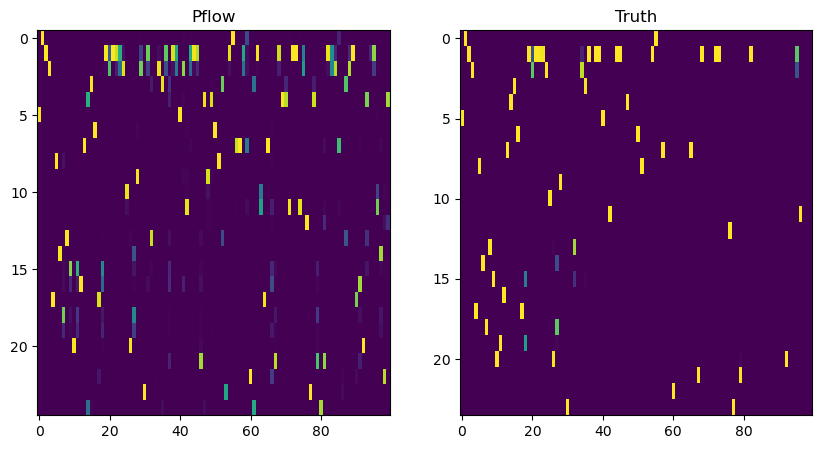

In [98]:
plot_incidences(
    pflow_incidence,
    truth_incidence,
    0,
    pflow_ind=pflow_indicator,
    truth_ind=truth_indicator,
    ind_threshold=0.5,
)

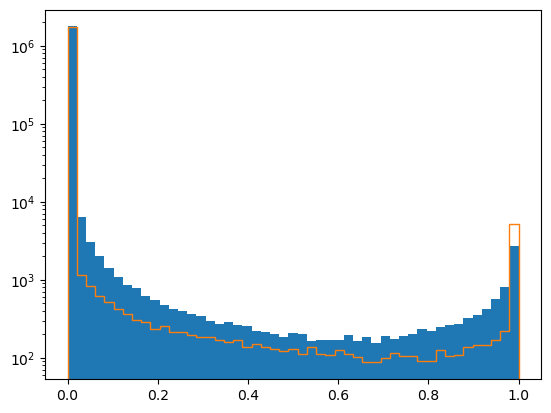

In [99]:
plt.hist(
    np.concatenate(pflow_incidence)[np.concatenate(pflow_indicator) > 0.5].flatten(),
    bins=np.linspace(0, 1, 50),
)
plt.hist(
    np.concatenate(truth_incidence)[np.concatenate(truth_indicator) > 0.5].flatten(),
    bins=np.linspace(0, 1, 50),
    histtype="step",
)
plt.yscale("log")

In [172]:
eval_filepath = "/share/gpu1/syw24/hepattn/logs/CLIC_Pflow_FullDiceFocFix_bf16_mixed_4gpu_oldloss_modified_20250709-T104047/ckpts/epoch=198-val_loss=3.30563__test.h5"

In [173]:
def load_file_simple(filepath, return_dict=False):
    with h5py.File(filepath, "r") as f:
        truth_incidence_bool = f["object_masks"]["truth_masks"][:]
        pflow_incidence_bool = f["object_masks"]["mask_logits"][:]

        if "incidence" in f:
            truth_incidence = f["incidence"]["truth_incidence"][:]
            pflow_incidence = f["incidence"]["pred_incidence"][:]
        else:
            truth_incidence = np.zeros_like(truth_incidence_bool)
            pflow_incidence = np.zeros_like(pflow_incidence_bool)

        pflow_incidence = pflow_incidence

        pflow_incidence_bool = pflow_incidence_bool

        truth_class = f["object_class"]["object_class"][:]
        if "Bin" in filepath:
            pflow_class_probs_raw = np.stack([f["object_class"][f"class_probs_{i}"][:] for i in range(2)], axis=-1)
            pflow_class_probs = pflow_class_probs_raw
            pflow_class = np.argmax(pflow_class_probs, axis=-1)
        else:
            pflow_class_probs_raw = np.stack([f["object_class"][f"class_probs_{i}"][:] for i in range(6)], axis=-1)
            pflow_class_probs = pflow_class_probs_raw
            pflow_class = np.argmax(pflow_class_probs, axis=-1)

        truth_data = np.stack([f["regression"][f"truth_{el}"][:] for el in ["e", "pt", "eta", "sinphi", "cosphi"]], axis=-1)
        pflow_data = np.stack([f["regression"][f"pred_{el}"][:] for el in ["e", "pt", "eta", "sinphi", "cosphi"]], axis=-1)
        proxy_data = np.stack([f["regression"][f"proxy_{el}"][:] for el in ["e", "pt", "eta", "sinphi", "cosphi"]], axis=-1)

        pflow_ptetaphi = np.stack(
            [
                ds.var_transform["pt"].inverse_transform(torch.from_numpy(pflow_data[..., 1])).numpy(),
                ds.var_transform["eta"].inverse_transform(torch.from_numpy(pflow_data[..., 2])).numpy(),
                np.arctan2(pflow_data[..., 3], pflow_data[..., 4]),
            ],
            axis=-1,
        )
        truth_ptetaphi = np.stack(
            [
                ds.var_transform["pt"].inverse_transform(torch.from_numpy(truth_data[..., 1])).numpy(),
                ds.var_transform["eta"].inverse_transform(torch.from_numpy(truth_data[..., 2])).numpy(),
                np.arctan2(truth_data[..., 3], truth_data[..., 4]),
            ],
            axis=-1,
        )
        proxy_ptetaphi = np.stack(
            [
                ds.var_transform["pt"].inverse_transform(torch.from_numpy(proxy_data[..., 1])).numpy(),
                ds.var_transform["eta"].inverse_transform(torch.from_numpy(proxy_data[..., 2])).numpy(),
                np.arctan2(proxy_data[..., 3], proxy_data[..., 4]),
            ],
            axis=-1,
        )

        if "Bin" in filepath:
            pflow_indicator = pflow_class < 1
            truth_indicator = truth_class < 1
        else:
            pflow_indicator = pflow_class < 5
            # pflow_indicator = truth_class < 5
            truth_indicator = truth_class < 5

        neutral_mask = (pflow_class < 5) & (pflow_class > 2)
        pflow_ptetaphi[neutral_mask][..., 0] = ds.var_transform["e"].inverse_transform(
            torch.from_numpy(pflow_data[neutral_mask][..., 0])
        ).numpy() / np.cosh(pflow_ptetaphi[neutral_mask][..., 1])
        proxy_ptetaphi[neutral_mask][..., 0] = ds.var_transform["e"].inverse_transform(
            torch.from_numpy(proxy_data[neutral_mask][..., 0])
        ).numpy() / np.cosh(proxy_ptetaphi[neutral_mask][..., 1])
        if return_dict:
            return {
                "pflow_incidence": pflow_incidence,
                "truth_incidence": truth_incidence,
                "pflow_class": pflow_class,
                "truth_class": truth_class,
                "pflow_class_probs": pflow_class_probs,
                "truth_class_probs": pflow_class_probs_raw,
                "pflow_data": pflow_data,
                "truth_data": truth_data,
                "proxy_data": proxy_data,
                "pflow_ptetaphi": pflow_ptetaphi,
                "truth_ptetaphi": truth_ptetaphi,
                "proxy_ptetaphi": proxy_ptetaphi,
                "pflow_indicator": pflow_indicator,
                "truth_indicator": truth_indicator,
            }

        return (
            pflow_incidence,
            truth_incidence,
            pflow_incidence_bool,
            truth_incidence_bool,
            pflow_class,
            truth_class,
            pflow_class_probs,
            pflow_class_probs_raw,
            pflow_data,
            truth_data,
            proxy_data,
            pflow_ptetaphi,
            truth_ptetaphi,
            proxy_ptetaphi,
            pflow_indicator,
            truth_indicator,
        )